In [1]:
from cscg_actions import *
from ged import *
from util import *

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import random
import os
import pickle

In [24]:
def generate_custom_colors(num_unique_observations):
    # Define a fixed set of custom colors as RGB values
    predefined_colors = np.array([
        [214, 214, 214],
        [85, 35, 157],
        [253, 252, 144],
        [114, 245, 144],
        [151, 38, 20],
        [239, 142, 192],
        [214, 134, 48],
        [140, 194, 250],
        [72, 160, 162],
    ])

    # If the number of unique observations is greater than the number of predefined colors,
    # cycle through the predefined colors to ensure enough colors are available
    if num_unique_observations > len(predefined_colors):
        extra_colors_needed = num_unique_observations - len(predefined_colors)
        additional_colors = np.tile(predefined_colors, (extra_colors_needed // len(predefined_colors) + 1, 1))
        custom_colors = np.vstack((predefined_colors, additional_colors))[:num_unique_observations]
    else:
        custom_colors = predefined_colors[:num_unique_observations]

    return custom_colors


# Function to create a lattice graph with variable nodes, observations, and aliased states
def create_modular_graph_varied(num_nodes=15, num_observations=10000, num_aliased_states=10, num_modules=3):
    if num_nodes < 4:
        raise ValueError("num_nodes must be at least 4 to allow for meaningful connectivity.")

    if num_nodes < num_modules:
        raise ValueError("Number of nodes must be at least equal to the number of modules to form a meaningful structure.")

    # Initialize the adjacency matrix
    T = np.zeros((num_nodes, num_nodes))

    # Calculate the size of each module
    module_size = num_nodes // num_modules

    for module_index in range(num_modules):
        module_start = module_index * module_size
        # For the last module, extend to the end of the node list
        module_end = module_start + module_size if module_index < num_modules - 1 else num_nodes

        # Fully connect nodes within the module
        for i in range(module_start, module_end):
            for j in range(module_start, module_end):
                if i != j:
                    T[i, j] = 1.0
    # Optionally, add sparse inter-module connections
    # Example: Connecting last node of one module to first node of the next module
    for module_index in range(num_modules - 1):
        module_end = (module_index + 1) * module_size - 1
        next_module_start = (module_end + 1) % num_nodes
        T[module_end, next_module_start] = 1.0
        T[next_module_start, module_end] = 1.0
    # connect first and last module
    T[0, num_nodes-1] = 1.0
    T[num_nodes-1,0] = 1.0



    # Generate observations based on random walks on the lattice graph
    states = [np.random.choice(range(num_nodes))]  # Start from a random state
    for _ in range(1, num_observations):
        current_state = states[-1]
        possible_next_states = np.where(T[current_state, :] > 0)[0]
        next_state = np.random.choice(possible_next_states)
        states.append(next_state)


    # Map states to observations with aliasing
    if num_aliased_states > num_nodes or num_aliased_states < 1:
        raise ValueError("num_aliased_states must be between 1 and the number of nodes.")


    unique_obs = np.arange(num_nodes - num_aliased_states)
    for n in range(num_aliased_states):
      unique_obs = np.append(unique_obs,random.choice(unique_obs))
    state_to_obs = unique_obs # Aliasing version

    # Create observation data
    x = state_to_obs[states]

    # plt.matshow(T)
    # plt.show()

    return x, T, state_to_obs

# Function to create a lattice graph with variable nodes, observations, and aliased states
def create_lattice_graph_varied(num_nodes=15, num_observations=10000, num_aliased_states=10):
    if num_nodes < 4:
        raise ValueError("num_nodes must be at least 4 to allow for meaningful connectivity.")

    # Initialize the adjacency matrix
    T = np.zeros((num_nodes, num_nodes))

    # Connect each node to its immediate and second-order neighbors with wrapping
    for i in range(num_nodes):
        for offset in [-2, -1, 1, 2]:  # Immediate and second-order neighbors
            j = (i + offset) % num_nodes
            T[i, j] = 1.0

    # Generate observations based on random walks on the lattice graph
    states = [np.random.choice(range(num_nodes))]  # Start from a random state
    for _ in range(1, num_observations):
        current_state = states[-1]
        possible_next_states = np.where(T[current_state, :] > 0)[0]
        next_state = np.random.choice(possible_next_states)
        states.append(next_state)


    # Map states to observations with aliasing
    if num_aliased_states > num_nodes or num_aliased_states < 1:
        raise ValueError("num_aliased_states must be between 1 and the number of nodes.")


    unique_obs = np.arange(num_nodes - num_aliased_states)
    for n in range(num_aliased_states):
      unique_obs = np.append(unique_obs,random.choice(unique_obs))
    state_to_obs = unique_obs # Aliasing version

    # Create observation data
    x = state_to_obs[states]

    # plt.matshow(T)

    return x, T, state_to_obs


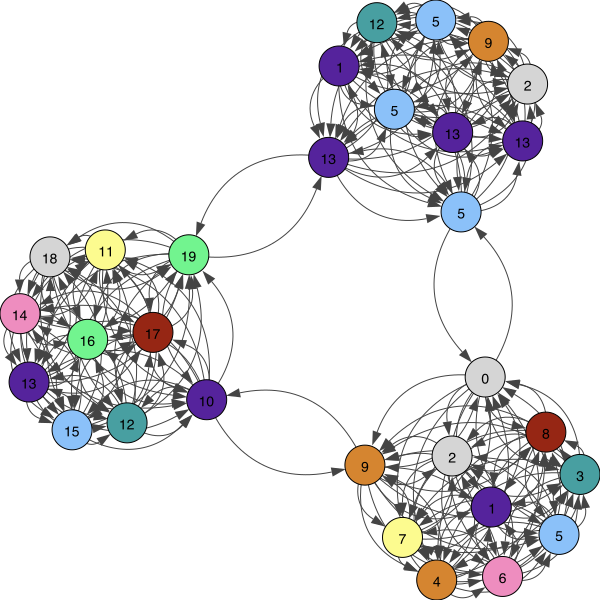

In [37]:
import igraph as ig

# def plot_graph(T):
#     # Convert adjacency matrix to an edge list
#     g = ig.Graph.Adjacency((T > 0).tolist())
#     g.es['weight'] = T[T.nonzero()]  # Set weights

#     # Plot the graph
#     output_file = 'aa.png'
#     out = igraph.plot(
#     g,
#     output_file,
#     layout=g.layout("kamada_kawai"),
#     vertex_color=colors,
#     # vertex_label=v,
#     vertex_size=30,
#     margin=50,
# )

    # layout = g.layout('kk')  # Kamada-Kawai layout for nice graph drawing
    # ig.plot(g, layout=layout, vertex_label=range(g.vcount()), margin=20)
    # # ig.show()
    # display(Image(filename='a.jpg'))

xm, Tm, sm = create_modular_graph_varied(num_nodes, num_observations, num_aliased_states)
xl,Tl, sl = create_lattice_graph_varied(num_nodes, num_observations, num_aliased_states)


node_labels = sm
# if multiple_episodes:
    # node_labels -= 1
colors = [cmap(nl)[:3] for nl in node_labels / node_labels.max()]
# out=[]

g = g = ig.Graph.Adjacency((Tm > 0).tolist())
g.es['weight'] = Tm[Tm.nonzero()]  # Set weights
ig.plot(g, 'modular.png', vertex_color=colors, vertex_label=node_labels, vertex_size=40)
# plot_graph(Tm)
# display(Image(filename=temp_output_file))

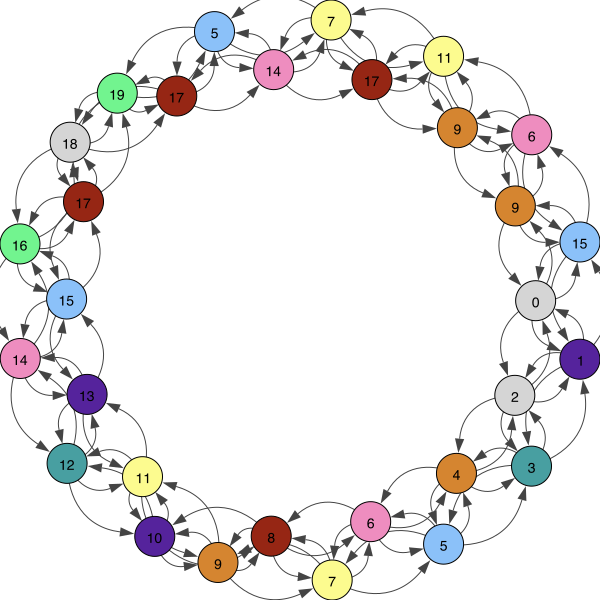

In [36]:
node_labels = sl
# if multiple_episodes:
    # node_labels -= 1
colors = [cmap(nl)[:3] for nl in node_labels / node_labels.max()]
# out=[]

g = g = ig.Graph.Adjacency((Tl > 0).tolist())
g.es['weight'] = Tl[Tl.nonzero()]  # Set weights
ig.plot(g,'lattice.png', vertex_color=colors, vertex_label=node_labels, vertex_size=40, )

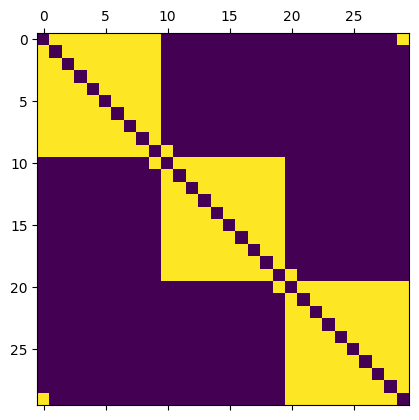

In [30]:
plt.matshow(Tm)

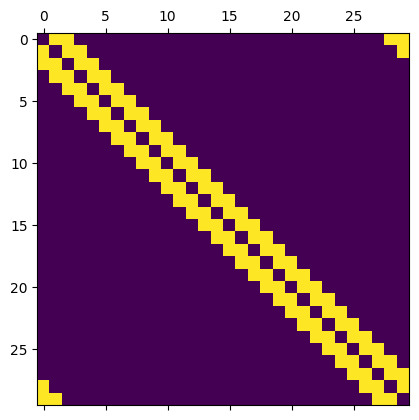

In [31]:
plt.matshow(Tl)

In [26]:
sm

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19,  4,  4, 17, 15,  0, 17, 17, 17,  4, 11])

In [4]:
# Create observation data

num_nodes = 30
num_observations = 50000
num_aliased_states = 2  # Adjust this to change the number of aliased states
num_clones = 10
num_modules=3
var_clones = np.arange(1,15,1)
# total_modularity_scores = []
var_aliasing = np.arange(2,4,1)

aliasing = 3

num_aliased_states = num_nodes//aliasing  # Adjust this to change the number of aliased states


x = create_lattice_graph_varied(num_nodes, num_observations, num_aliased_states)
a = np.zeros(len(x), dtype=int)

model_lattice_alpha_0.1_seed_0.pkl
decode C: (1, 42, 42)
decode T: (1, 42, 42)
decode Pi: (20,)
decode n_clones: [2 3 2 1 1 3 1 2 5 3 3 1 2 1 1 4 3 1 1 2]
decode C: (1, 42, 42)
decode T: (1, 42, 42)
decode Pi: (20,)
decode n_clones: [2 3 2 1 1 3 1 2 5 3 3 1 2 1 1 4 3 1 1 2]


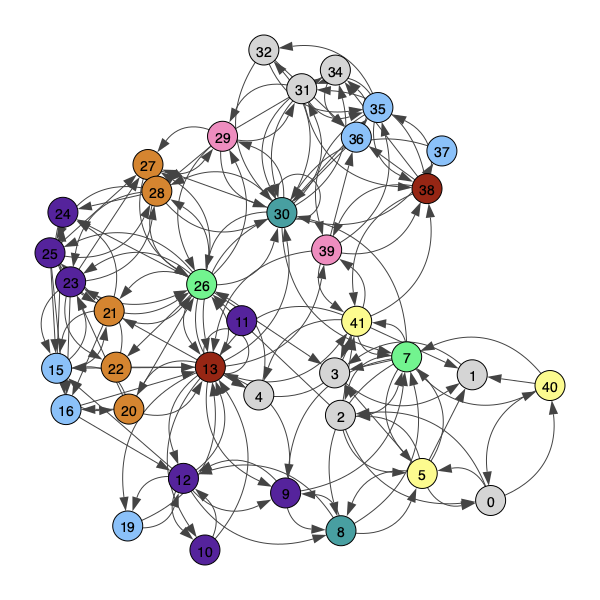

Room 0 has 2 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 2 tables (clones)
Room 3 has 1 tables (clones)
Room 4 has 1 tables (clones)
Room 5 has 3 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 5 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 3 tables (clones)
Room 11 has 1 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 1 tables (clones)
Room 14 has 1 tables (clones)
Room 15 has 4 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 1 tables (clones)
Room 18 has 1 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 42
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_10.pkl
decode C: (1, 52, 52)
decode T: (1, 52, 52)
decode Pi: (20,)
decode n_clones: [4 1 6 2 2 1 2 2 1 5 2 2 2 2 4 3 3 3 3 2]
decode C: (1, 52, 52)
decode T: (1, 52, 52)
decode Pi: (20,)
decode n_clones: [4 1 6 2 2 1 2 2 1 5 2 2 2 2 4 3 3 3 3 2]


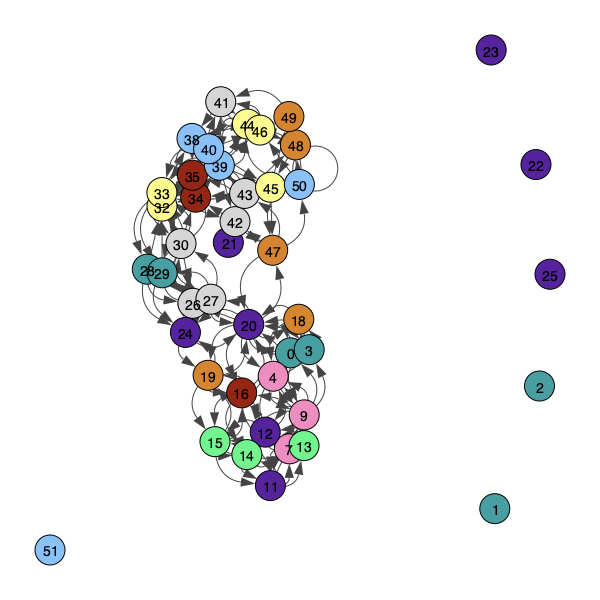

Room 0 has 4 tables (clones)
Room 1 has 1 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 2 tables (clones)
Room 4 has 2 tables (clones)
Room 5 has 1 tables (clones)
Room 6 has 2 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 1 tables (clones)
Room 9 has 5 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 2 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 3 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 52
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_20.pkl
decode C: (1, 35, 35)
decode T: (1, 35, 35)
decode Pi: (20,)
decode n_clones: [2 2 2 1 2 3 1 2 1 2 2 2 1 3 2 1 1 2 1 2]
decode C: (1, 35, 35)
decode T: (1, 35, 35)
decode Pi: (20,)
decode n_clones: [2 2 2 1 2 3 1 2 1 2 2 2 1 3 2 1 1 2 1 2]


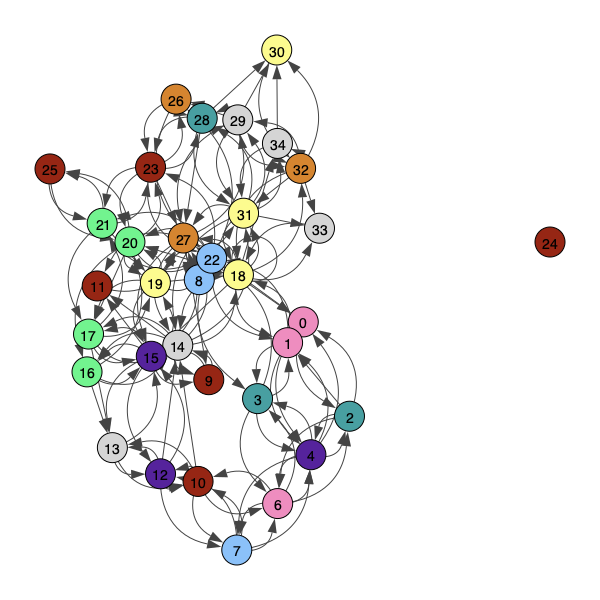

Room 0 has 2 tables (clones)
Room 1 has 2 tables (clones)
Room 2 has 2 tables (clones)
Room 3 has 1 tables (clones)
Room 4 has 2 tables (clones)
Room 5 has 3 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 1 tables (clones)
Room 9 has 2 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 2 tables (clones)
Room 12 has 1 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 2 tables (clones)
Room 15 has 1 tables (clones)
Room 16 has 1 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 1 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 35
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_30.pkl
decode C: (1, 43, 43)
decode T: (1, 43, 43)
decode Pi: (20,)
decode n_clones: [3 3 2 1 2 2 1 4 4 1 2 3 1 1 3 2 4 2 1 1]
decode C: (1, 43, 43)
decode T: (1, 43, 43)
decode Pi: (20,)
decode n_clones: [3 3 2 1 2 2 1 4 4 1 2 3 1 1 3 2 4 2 1 1]


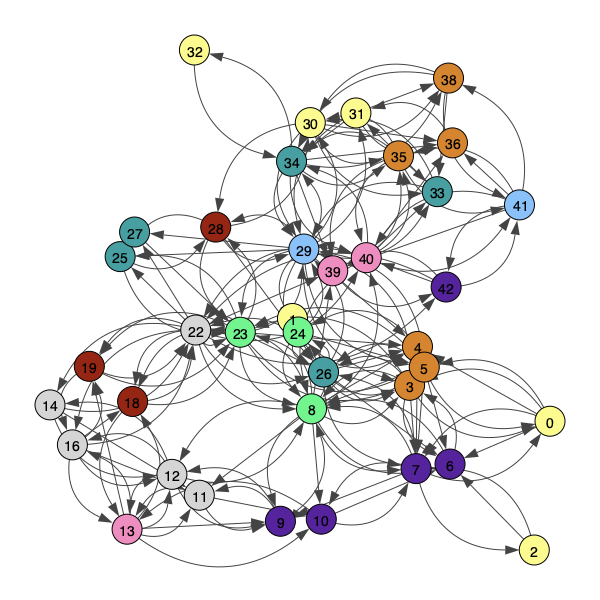

Room 0 has 3 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 2 tables (clones)
Room 3 has 1 tables (clones)
Room 4 has 2 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 4 tables (clones)
Room 9 has 1 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 1 tables (clones)
Room 13 has 1 tables (clones)
Room 14 has 3 tables (clones)
Room 15 has 2 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 1 tables (clones)
Room 19 has 1 tables (clones)
Total clones used: 43
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_40.pkl
decode C: (1, 34, 34)
decode T: (1, 34, 34)
decode Pi: (20,)
decode n_clones: [2 2 1 1 1 2 1 3 1 1 1 1 2 3 2 3 3 1 1 2]
decode C: (1, 34, 34)
decode T: (1, 34, 34)
decode Pi: (20,)
decode n_clones: [2 2 1 1 1 2 1 3 1 1 1 1 2 3 2 3 3 1 1 2]


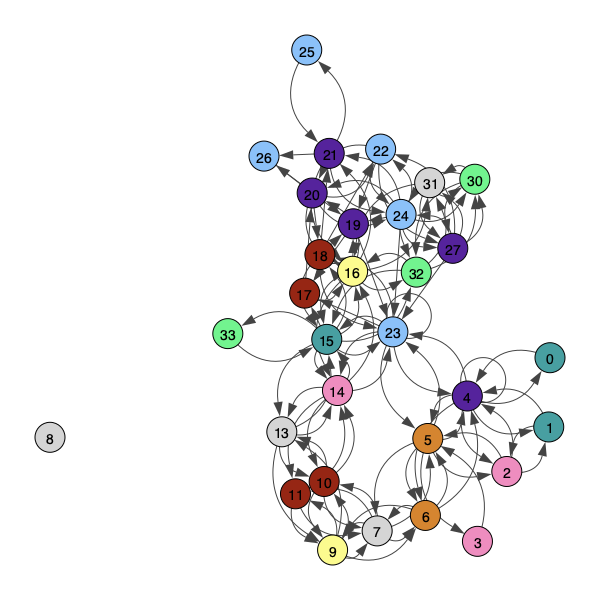

Room 0 has 2 tables (clones)
Room 1 has 2 tables (clones)
Room 2 has 1 tables (clones)
Room 3 has 1 tables (clones)
Room 4 has 1 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 1 tables (clones)
Room 9 has 1 tables (clones)
Room 10 has 1 tables (clones)
Room 11 has 1 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 2 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 1 tables (clones)
Room 18 has 1 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 34
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_50.pkl
decode C: (1, 37, 37)
decode T: (1, 37, 37)
decode Pi: (20,)
decode n_clones: [4 2 1 3 1 3 1 2 1 2 2 2 3 1 1 1 1 2 2 2]
decode C: (1, 37, 37)
decode T: (1, 37, 37)
decode Pi: (20,)
decode n_clones: [4 2 1 3 1 3 1 2 1 2 2 2 3 1 1 1 1 2 2 2]


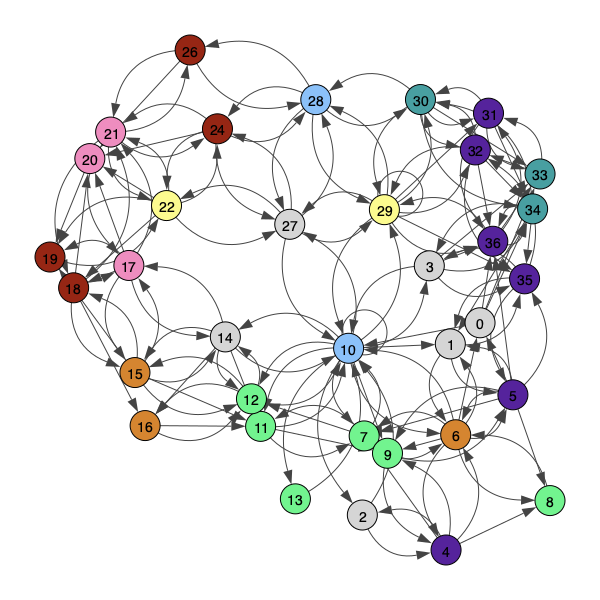

Room 0 has 4 tables (clones)
Room 1 has 2 tables (clones)
Room 2 has 1 tables (clones)
Room 3 has 3 tables (clones)
Room 4 has 1 tables (clones)
Room 5 has 3 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 1 tables (clones)
Room 9 has 2 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 2 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 1 tables (clones)
Room 14 has 1 tables (clones)
Room 15 has 1 tables (clones)
Room 16 has 1 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 2 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 37
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_60.pkl
decode C: (1, 50, 50)
decode T: (1, 50, 50)
decode Pi: (20,)
decode n_clones: [1 5 4 3 5 3 1 2 2 1 1 3 3 3 1 4 2 2 2 2]
decode C: (1, 50, 50)
decode T: (1, 50, 50)
decode Pi: (20,)
decode n_clones: [1 5 4 3 5 3 1 2 2 1 1 3 3 3 1 4 2 2 2 2]


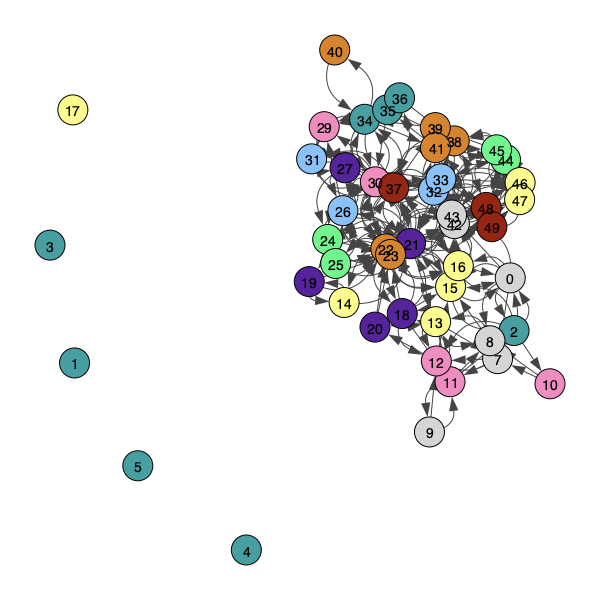

Room 0 has 1 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 4 tables (clones)
Room 3 has 3 tables (clones)
Room 4 has 5 tables (clones)
Room 5 has 3 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 2 tables (clones)
Room 9 has 1 tables (clones)
Room 10 has 1 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 1 tables (clones)
Room 15 has 4 tables (clones)
Room 16 has 2 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 2 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 50
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_70.pkl
decode C: (1, 48, 48)
decode T: (1, 48, 48)
decode Pi: (20,)
decode n_clones: [2 1 3 3 2 1 1 3 4 3 4 2 2 3 1 2 2 2 3 4]
decode C: (1, 48, 48)
decode T: (1, 48, 48)
decode Pi: (20,)
decode n_clones: [2 1 3 3 2 1 1 3 4 3 4 2 2 3 1 2 2 2 3 4]


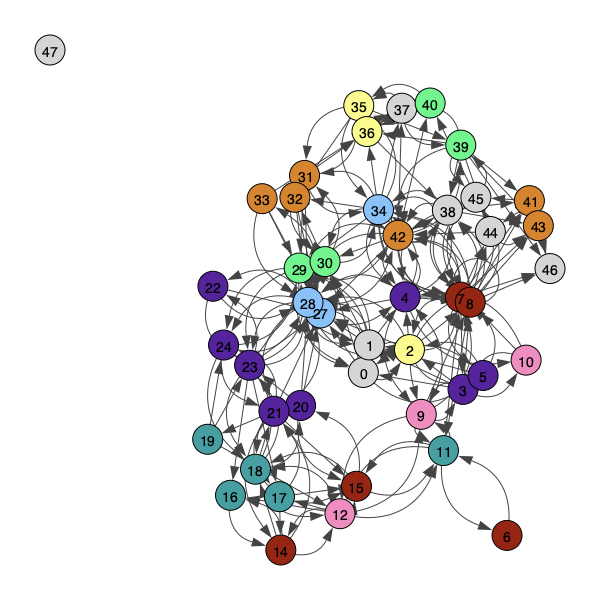

Room 0 has 2 tables (clones)
Room 1 has 1 tables (clones)
Room 2 has 3 tables (clones)
Room 3 has 3 tables (clones)
Room 4 has 2 tables (clones)
Room 5 has 1 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 4 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 4 tables (clones)
Room 11 has 2 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 1 tables (clones)
Room 15 has 2 tables (clones)
Room 16 has 2 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 48
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_80.pkl
decode C: (1, 42, 42)
decode T: (1, 42, 42)
decode Pi: (20,)
decode n_clones: [1 3 3 1 5 2 1 2 2 2 3 2 3 1 2 3 2 2 1 1]
decode C: (1, 42, 42)
decode T: (1, 42, 42)
decode Pi: (20,)
decode n_clones: [1 3 3 1 5 2 1 2 2 2 3 2 3 1 2 3 2 2 1 1]


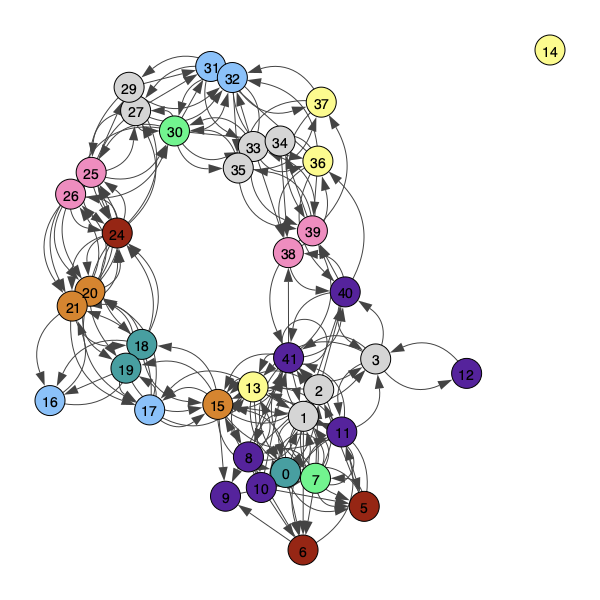

Room 0 has 1 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 3 tables (clones)
Room 3 has 1 tables (clones)
Room 4 has 5 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 2 tables (clones)
Room 9 has 2 tables (clones)
Room 10 has 3 tables (clones)
Room 11 has 2 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 1 tables (clones)
Room 14 has 2 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 2 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 1 tables (clones)
Room 19 has 1 tables (clones)
Total clones used: 42
Clones that would have been used by the original code: 100
model_lattice_alpha_0.1_seed_90.pkl
decode C: (1, 47, 47)
decode T: (1, 47, 47)
decode Pi: (20,)
decode n_clones: [5 1 2 2 1 2 1 3 2 1 4 3 3 3 2 2 3 3 2 2]
decode C: (1, 47, 47)
decode T: (1, 47, 47)
decode Pi: (20,)
decode n_clones: [5 1 2 2 1 2 1 3 2 1 4 3 3 3 2 2 3 3 2 2]


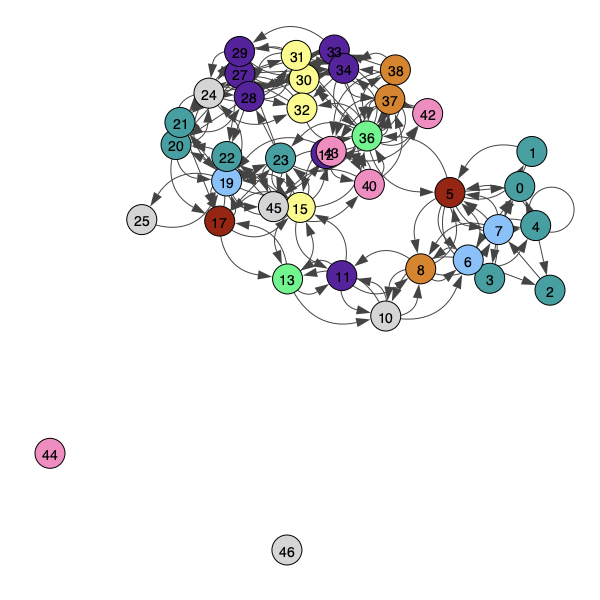

Room 0 has 5 tables (clones)
Room 1 has 1 tables (clones)
Room 2 has 2 tables (clones)
Room 3 has 2 tables (clones)
Room 4 has 1 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 2 tables (clones)
Room 9 has 1 tables (clones)
Room 10 has 4 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 2 tables (clones)
Room 15 has 2 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 3 tables (clones)
Room 18 has 2 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 47
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_0.pkl
decode C: (1, 64, 64)
decode T: (1, 64, 64)
decode Pi: (20,)
decode n_clones: [3 4 4 3 1 3 4 4 4 3 4 6 2 1 4 3 3 2 4 2]
decode C: (1, 64, 64)
decode T: (1, 64, 64)
decode Pi: (20,)
decode n_clones: [3 4 4 3 1 3 4 4 4 3 4 6 2 1 4 3 3 2 4 2]


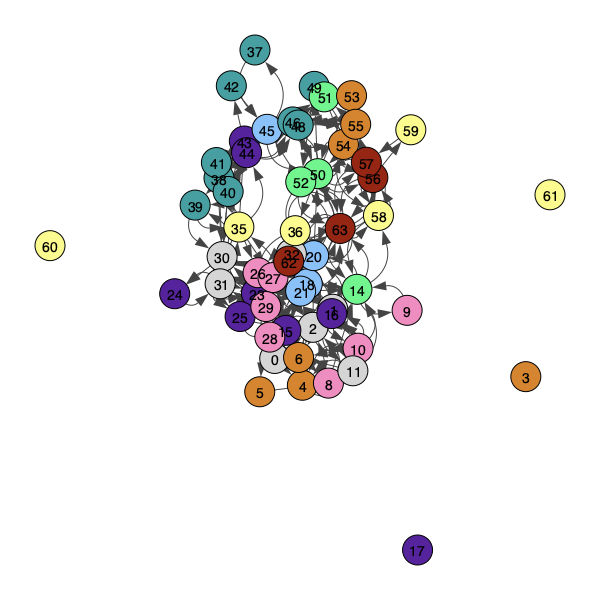

Room 0 has 3 tables (clones)
Room 1 has 4 tables (clones)
Room 2 has 4 tables (clones)
Room 3 has 3 tables (clones)
Room 4 has 1 tables (clones)
Room 5 has 3 tables (clones)
Room 6 has 4 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 4 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 4 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 1 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 4 tables (clones)
Room 19 has 2 tables (clones)
Total clones used: 64
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_10.pkl
decode C: (1, 65, 65)
decode T: (1, 65, 65)
decode Pi: (20,)
decode n_clones: [4 2 2 6 4 2 5 3 2 6 2 5 3 3 4 1 3 2 3 3]
decode C: (1, 65, 65)
decode T: (1, 65, 65)
decode Pi: (20,)
decode n_clones: [4 2 2 6 4 2 5 3 2 6 2 5 3 3 4 1 3 2 3 3]


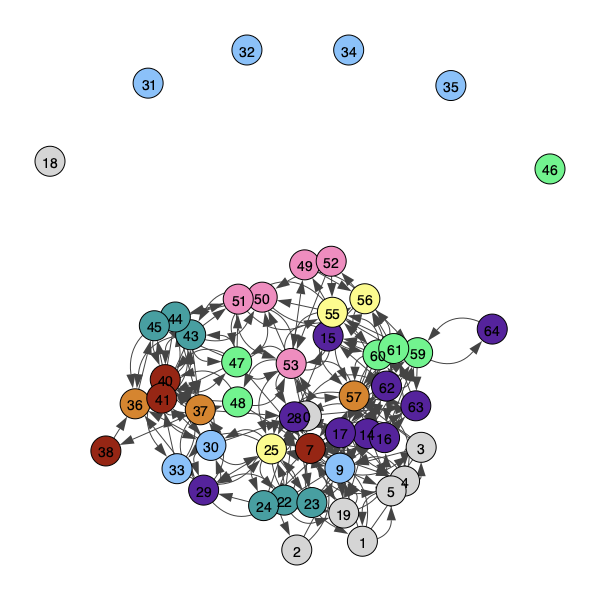

Room 0 has 4 tables (clones)
Room 1 has 2 tables (clones)
Room 2 has 2 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 4 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 5 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 2 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 5 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 1 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 3 tables (clones)
Total clones used: 65
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_20.pkl
decode C: (1, 65, 65)
decode T: (1, 65, 65)
decode Pi: (20,)
decode n_clones: [6 4 3 3 3 1 4 3 3 4 3 4 2 5 3 3 3 4 1 3]
decode C: (1, 65, 65)
decode T: (1, 65, 65)
decode Pi: (20,)
decode n_clones: [6 4 3 3 3 1 4 3 3 4 3 4 2 5 3 3 3 4 1 3]


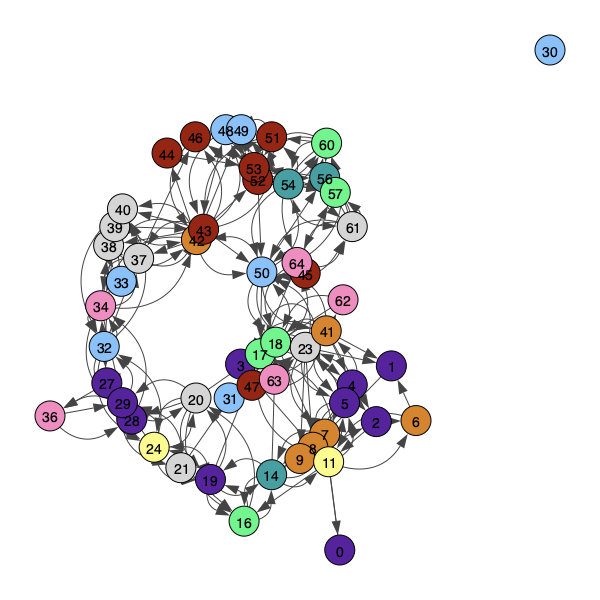

Room 0 has 6 tables (clones)
Room 1 has 4 tables (clones)
Room 2 has 3 tables (clones)
Room 3 has 3 tables (clones)
Room 4 has 3 tables (clones)
Room 5 has 1 tables (clones)
Room 6 has 4 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 4 tables (clones)
Room 10 has 3 tables (clones)
Room 11 has 4 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 3 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 4 tables (clones)
Room 18 has 1 tables (clones)
Room 19 has 3 tables (clones)
Total clones used: 65
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_30.pkl
decode C: (1, 80, 80)
decode T: (1, 80, 80)
decode Pi: (20,)
decode n_clones: [3 3 5 4 5 4 2 4 3 4 5 5 3 5 6 5 2 3 2 7]
decode C: (1, 80, 80)
decode T: (1, 80, 80)
decode Pi: (20,)
decode n_clones: [3 3 5 4 5 4 2 4 3 4 5 5 3 5 6 5 2 3 2 7]


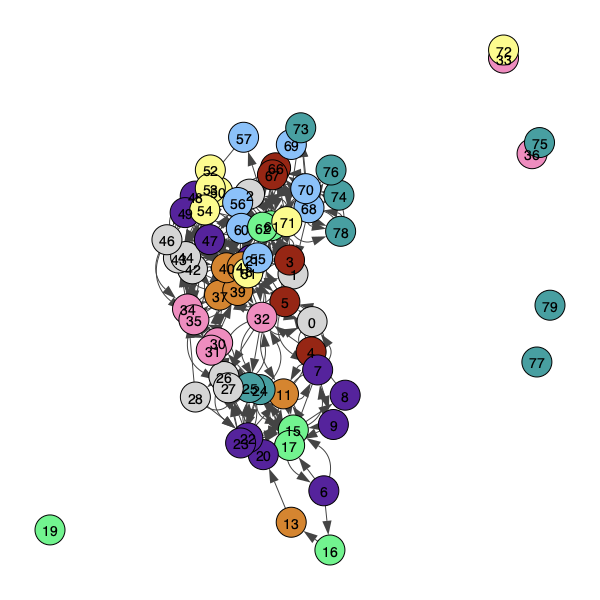

Room 0 has 3 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 5 tables (clones)
Room 5 has 4 tables (clones)
Room 6 has 2 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 4 tables (clones)
Room 10 has 5 tables (clones)
Room 11 has 5 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 6 tables (clones)
Room 15 has 5 tables (clones)
Room 16 has 2 tables (clones)
Room 17 has 3 tables (clones)
Room 18 has 2 tables (clones)
Room 19 has 7 tables (clones)
Total clones used: 80
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_40.pkl
decode C: (1, 63, 63)
decode T: (1, 63, 63)
decode Pi: (20,)
decode n_clones: [1 4 3 2 6 4 1 2 4 6 3 3 2 2 2 4 1 3 7 3]
decode C: (1, 63, 63)
decode T: (1, 63, 63)
decode Pi: (20,)
decode n_clones: [1 4 3 2 6 4 1 2 4 6 3 3 2 2 2 4 1 3 7 3]


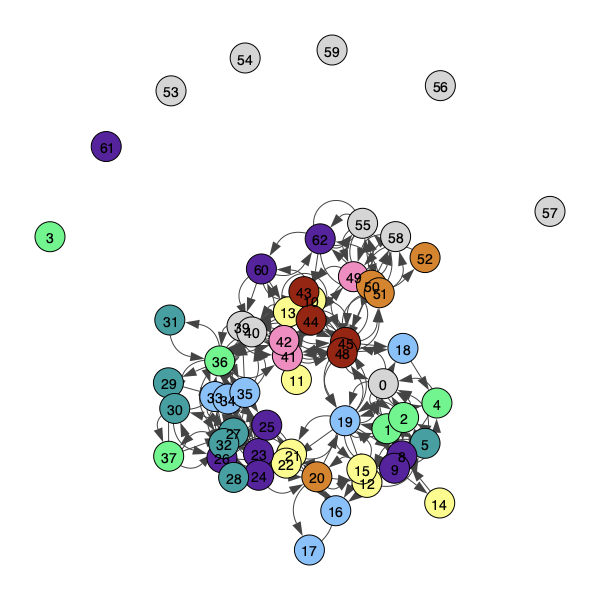

Room 0 has 1 tables (clones)
Room 1 has 4 tables (clones)
Room 2 has 3 tables (clones)
Room 3 has 2 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 4 tables (clones)
Room 6 has 1 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 4 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 3 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 2 tables (clones)
Room 15 has 4 tables (clones)
Room 16 has 1 tables (clones)
Room 17 has 3 tables (clones)
Room 18 has 7 tables (clones)
Room 19 has 3 tables (clones)
Total clones used: 63
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_50.pkl
decode C: (1, 61, 61)
decode T: (1, 61, 61)
decode Pi: (20,)
decode n_clones: [4 3 2 4 3 4 2 3 1 4 2 3 1 4 5 3 4 6 2 1]
decode C: (1, 61, 61)
decode T: (1, 61, 61)
decode Pi: (20,)
decode n_clones: [4 3 2 4 3 4 2 3 1 4 2 3 1 4 5 3 4 6 2 1]


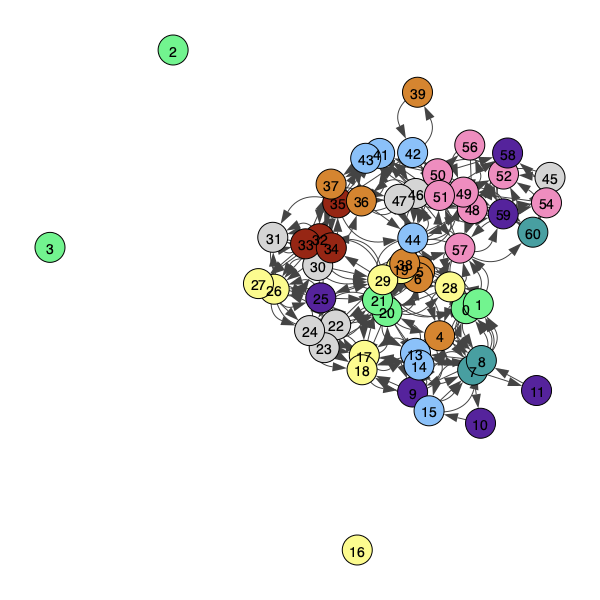

Room 0 has 4 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 2 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 3 tables (clones)
Room 5 has 4 tables (clones)
Room 6 has 2 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 1 tables (clones)
Room 9 has 4 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 1 tables (clones)
Room 13 has 4 tables (clones)
Room 14 has 5 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 6 tables (clones)
Room 18 has 2 tables (clones)
Room 19 has 1 tables (clones)
Total clones used: 61
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_60.pkl
decode C: (1, 65, 65)
decode T: (1, 65, 65)
decode Pi: (20,)
decode n_clones: [3 5 3 5 1 1 3 4 3 3 2 4 4 2 4 4 3 3 4 4]
decode C: (1, 65, 65)
decode T: (1, 65, 65)
decode Pi: (20,)
decode n_clones: [3 5 3 5 1 1 3 4 3 3 2 4 4 2 4 4 3 3 4 4]


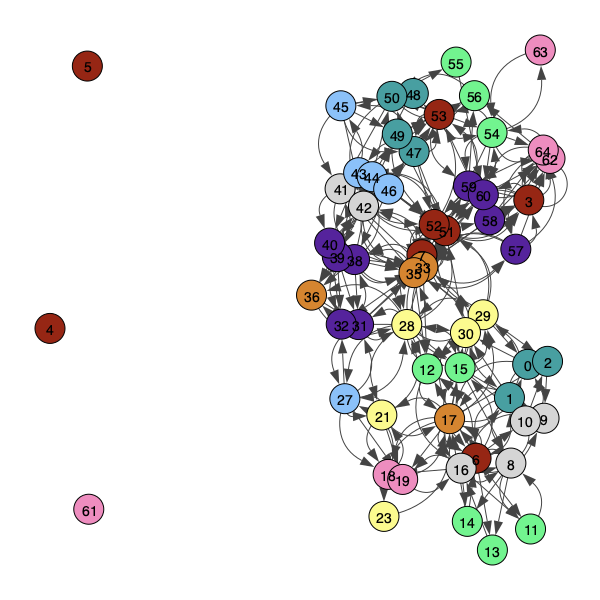

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 3 tables (clones)
Room 3 has 5 tables (clones)
Room 4 has 1 tables (clones)
Room 5 has 1 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 4 tables (clones)
Room 12 has 4 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 4 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 3 tables (clones)
Room 18 has 4 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 65
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_70.pkl
decode C: (1, 75, 75)
decode T: (1, 75, 75)
decode Pi: (20,)
decode n_clones: [4 3 4 5 3 2 2 2 2 3 4 4 2 7 7 3 3 4 4 7]
decode C: (1, 75, 75)
decode T: (1, 75, 75)
decode Pi: (20,)
decode n_clones: [4 3 4 5 3 2 2 2 2 3 4 4 2 7 7 3 3 4 4 7]


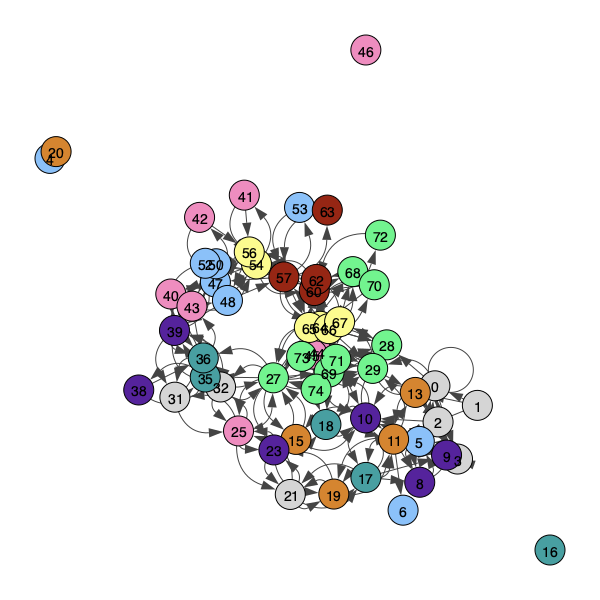

Room 0 has 4 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 4 tables (clones)
Room 3 has 5 tables (clones)
Room 4 has 3 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 2 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 2 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 4 tables (clones)
Room 11 has 4 tables (clones)
Room 12 has 2 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 4 tables (clones)
Room 18 has 4 tables (clones)
Room 19 has 7 tables (clones)
Total clones used: 75
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_80.pkl
decode C: (1, 59, 59)
decode T: (1, 59, 59)
decode Pi: (20,)
decode n_clones: [1 6 3 2 1 2 4 3 2 1 4 1 5 3 3 4 3 5 2 4]
decode C: (1, 59, 59)
decode T: (1, 59, 59)
decode Pi: (20,)
decode n_clones: [1 6 3 2 1 2 4 3 2 1 4 1 5 3 3 4 3 5 2 4]


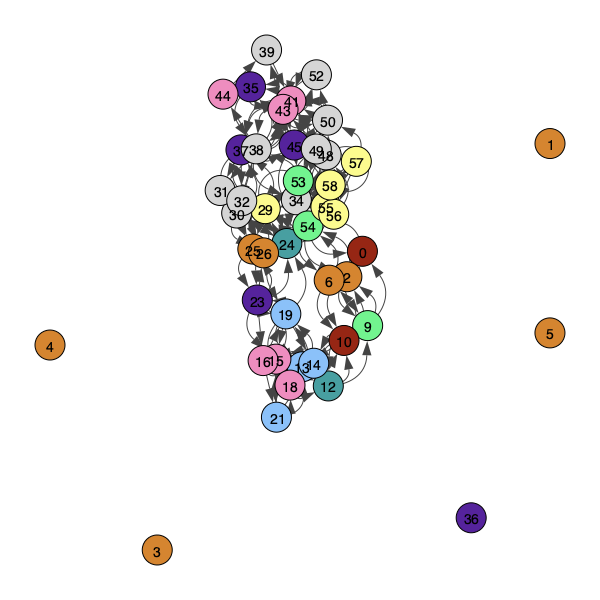

Room 0 has 1 tables (clones)
Room 1 has 6 tables (clones)
Room 2 has 3 tables (clones)
Room 3 has 2 tables (clones)
Room 4 has 1 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 4 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 2 tables (clones)
Room 9 has 1 tables (clones)
Room 10 has 4 tables (clones)
Room 11 has 1 tables (clones)
Room 12 has 5 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 3 tables (clones)
Room 15 has 4 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 5 tables (clones)
Room 18 has 2 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 59
Clones that would have been used by the original code: 100
model_lattice_alpha_0.2_seed_90.pkl
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


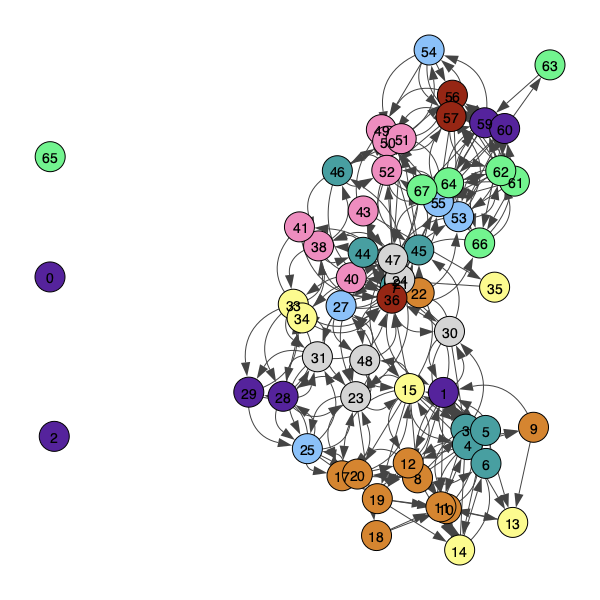

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


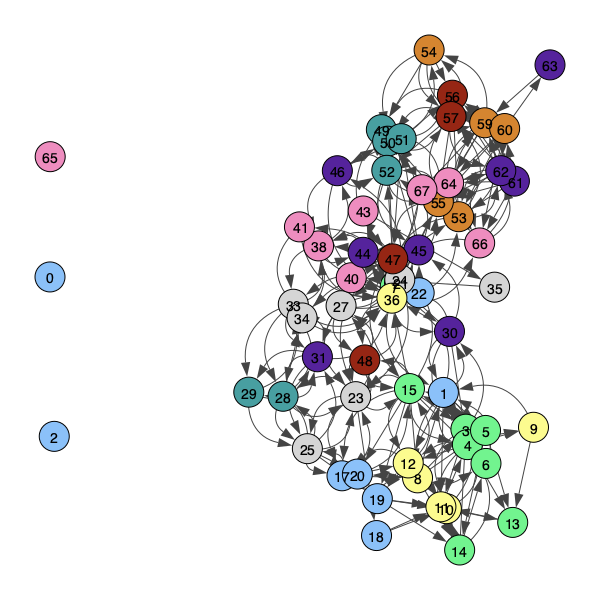

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


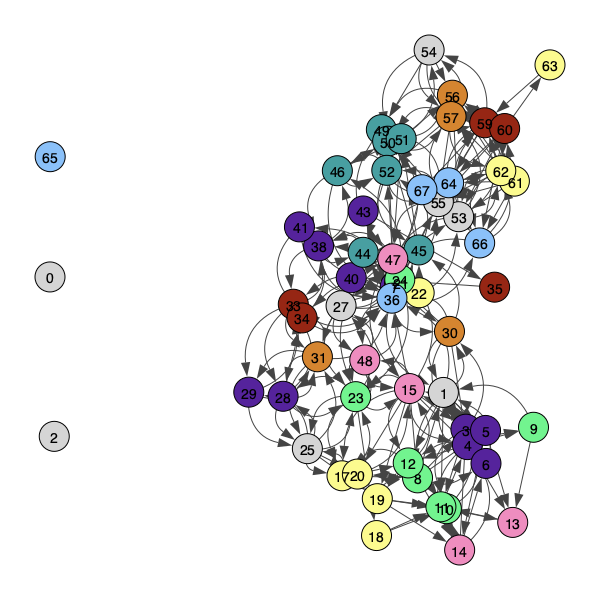

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


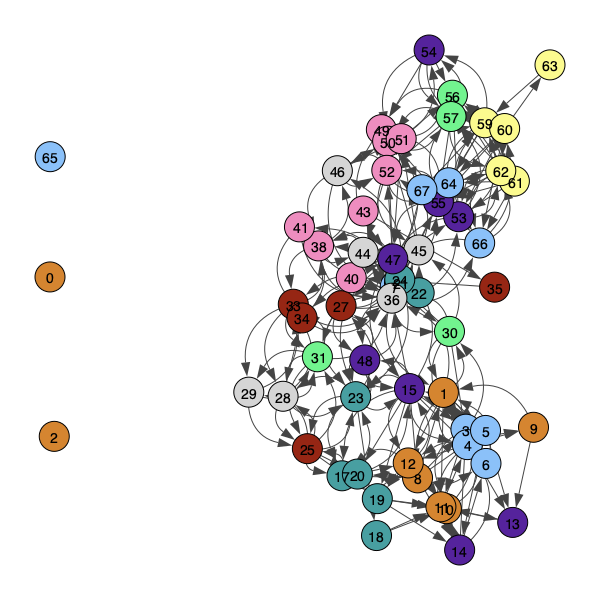

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


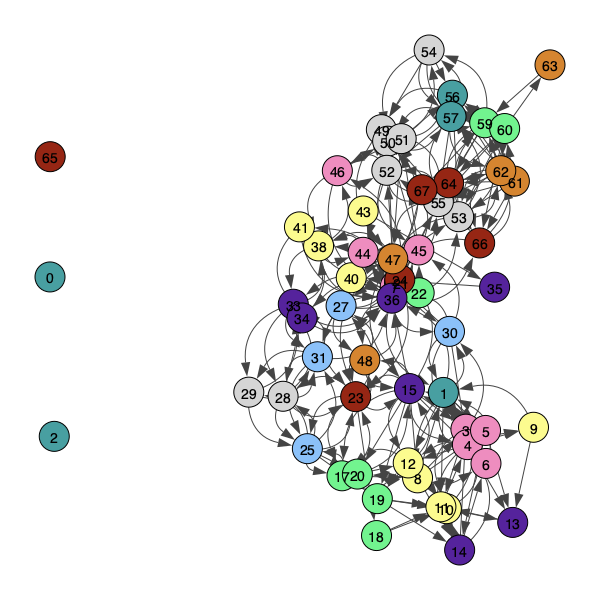

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


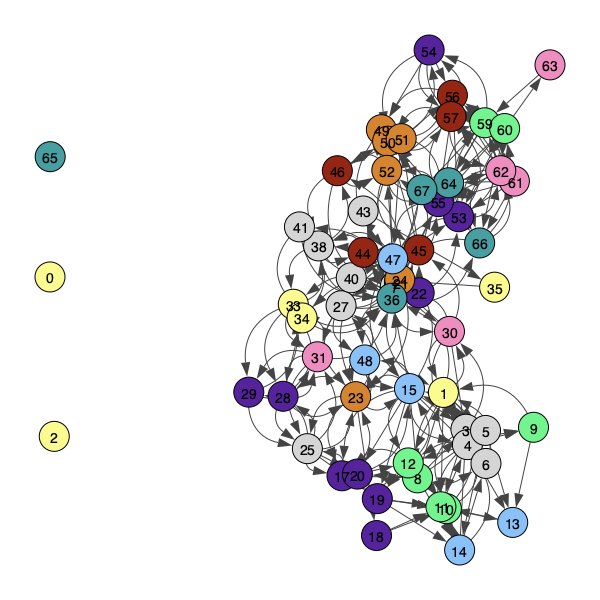

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


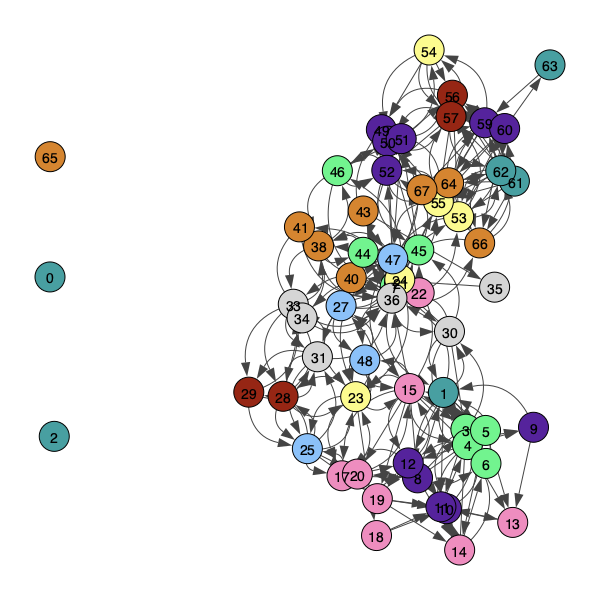

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


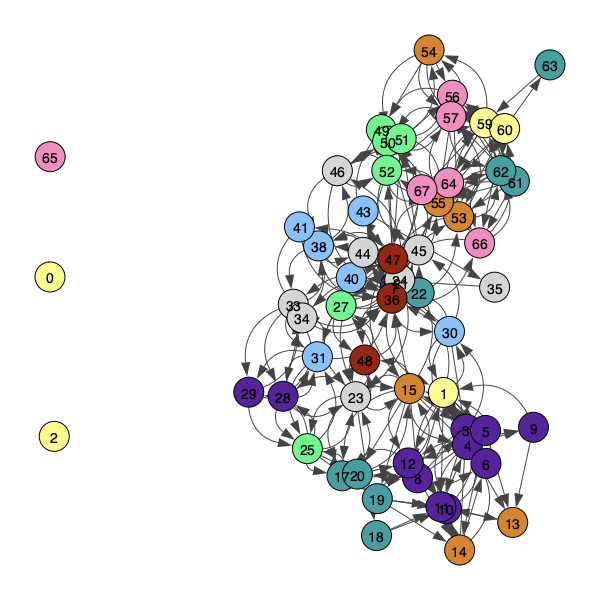

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


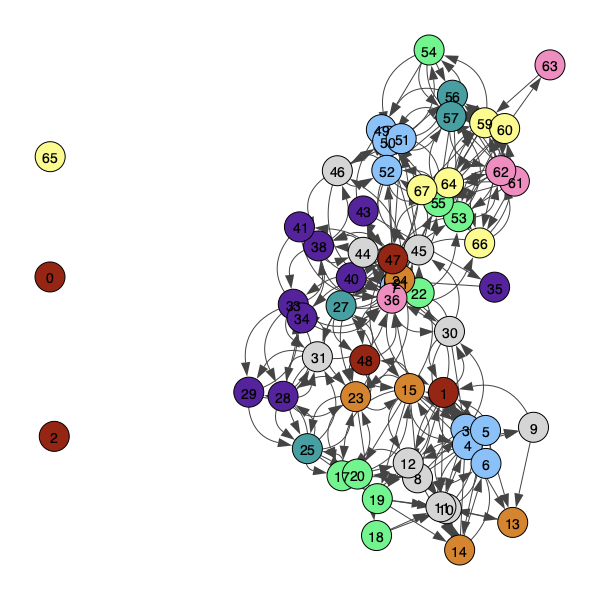

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


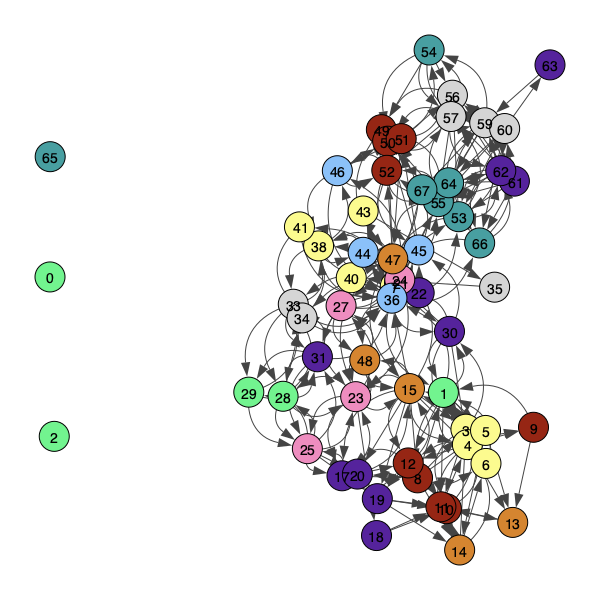

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]
decode C: (1, 68, 68)
decode T: (1, 68, 68)
decode Pi: (20,)
decode n_clones: [3 5 5 4 6 2 3 2 3 3 2 6 3 2 4 3 3 2 3 4]


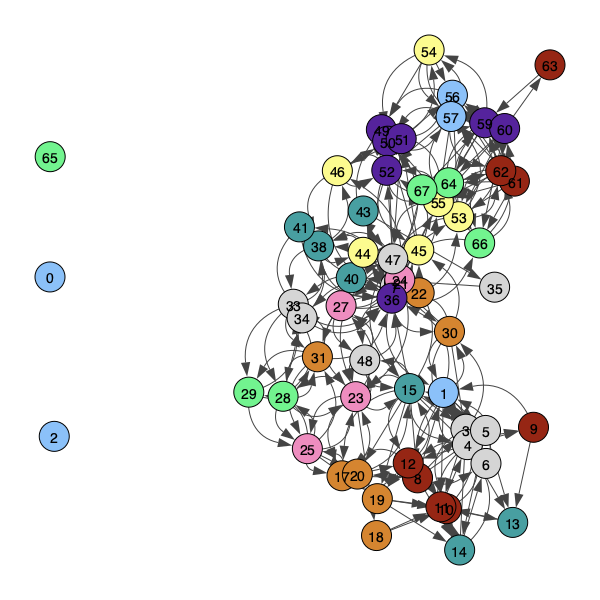

Room 0 has 3 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 2 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 2 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 68
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_0.pkl
decode C: (1, 123, 123)
decode T: (1, 123, 123)
decode Pi: (20,)
decode n_clones: [ 8  9  5  6  7  5  8  6  6  6  5  4  5  7  7  8  5  4  2 10]
decode C: (1, 123, 123)
decode T: (1, 123, 123)
decode Pi: (20,)
decode n_clones: [ 8  9  5  6  7  5  8  6  6  6  5  4  5  7  7  8  5  4  2 10]


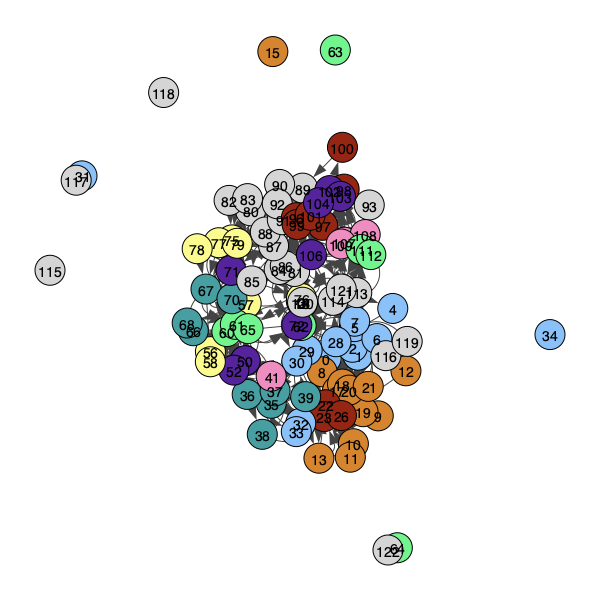

Room 0 has 8 tables (clones)
Room 1 has 9 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 5 tables (clones)
Room 6 has 8 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 5 tables (clones)
Room 11 has 4 tables (clones)
Room 12 has 5 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 4 tables (clones)
Room 18 has 2 tables (clones)
Room 19 has 10 tables (clones)
Total clones used: 123
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_10.pkl
decode C: (1, 118, 118)
decode T: (1, 118, 118)
decode Pi: (20,)
decode n_clones: [ 4  5  3  5  8  7 10  6  8  5  5  8  5 10  6  6  4  4  4  5]
decode C: (1, 118, 118)
decode T: (1, 118, 118)
decode Pi: (20,)
decode n_clones: [ 4  5  3  5  8  7 10  6  8  5  5  8  5 10  6  6  4  4  4  5]


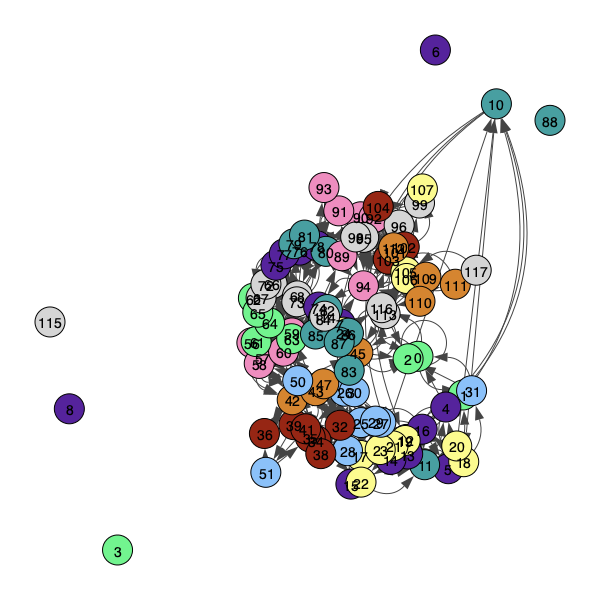

Room 0 has 4 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 3 tables (clones)
Room 3 has 5 tables (clones)
Room 4 has 8 tables (clones)
Room 5 has 7 tables (clones)
Room 6 has 10 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 8 tables (clones)
Room 9 has 5 tables (clones)
Room 10 has 5 tables (clones)
Room 11 has 8 tables (clones)
Room 12 has 5 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 6 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 4 tables (clones)
Room 18 has 4 tables (clones)
Room 19 has 5 tables (clones)
Total clones used: 118
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_20.pkl
decode C: (1, 121, 121)
decode T: (1, 121, 121)
decode Pi: (20,)
decode n_clones: [ 3  6 11  8  3  7  3  5  7  7  8  5  4  8  6  8  5  7  5  5]
decode C: (1, 121, 121)
decode T: (1, 121, 121)
decode Pi: (20,)
decode n_clones: [ 3  6 11  8  3  7  3  5  7  7  8  5  4  8  6  8  5  7  5  5]


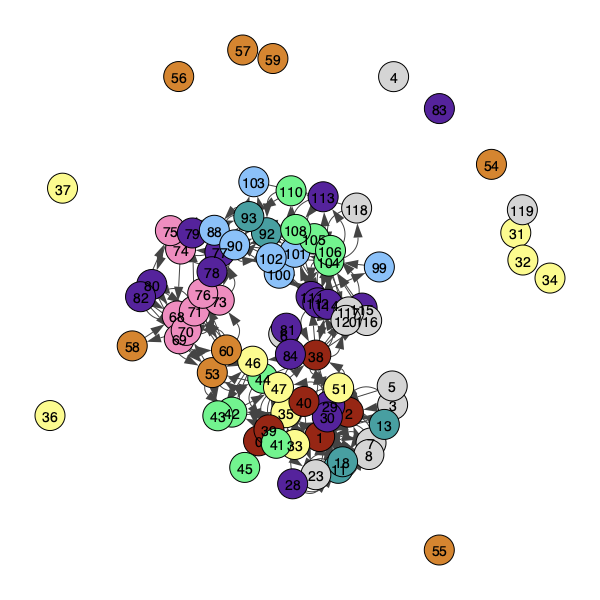

Room 0 has 3 tables (clones)
Room 1 has 6 tables (clones)
Room 2 has 11 tables (clones)
Room 3 has 8 tables (clones)
Room 4 has 3 tables (clones)
Room 5 has 7 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 5 tables (clones)
Room 8 has 7 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 8 tables (clones)
Room 11 has 5 tables (clones)
Room 12 has 4 tables (clones)
Room 13 has 8 tables (clones)
Room 14 has 6 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 5 tables (clones)
Total clones used: 121
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_30.pkl
decode C: (1, 118, 118)
decode T: (1, 118, 118)
decode Pi: (20,)
decode n_clones: [ 7  6  9  8  3  8  7  6  6  4  6  4 10  5  3  7  4  8  3  4]
decode C: (1, 118, 118)
decode T: (1, 118, 118)
decode Pi: (20,)
decode n_clones: [ 7  6  9  8  3  8  7  6  6  4  6  4 10  5  3  7  4  8  3  4]


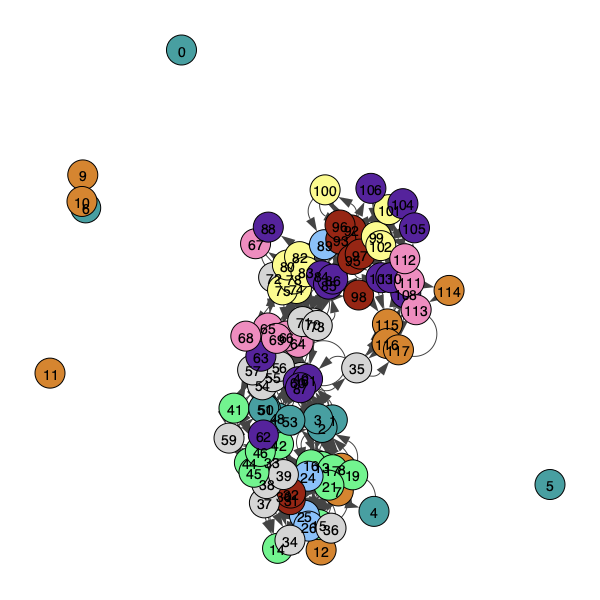

Room 0 has 7 tables (clones)
Room 1 has 6 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 8 tables (clones)
Room 4 has 3 tables (clones)
Room 5 has 8 tables (clones)
Room 6 has 7 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 4 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 4 tables (clones)
Room 12 has 10 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 3 tables (clones)
Room 15 has 7 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 118
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_40.pkl
decode C: (1, 110, 110)
decode T: (1, 110, 110)
decode Pi: (20,)
decode n_clones: [7 8 6 6 8 5 3 3 5 6 4 6 6 5 3 9 2 5 5 8]
decode C: (1, 110, 110)
decode T: (1, 110, 110)
decode Pi: (20,)
decode n_clones: [7 8 6 6 8 5 3 3 5 6 4 6 6 5 3 9 2 5 5 8]


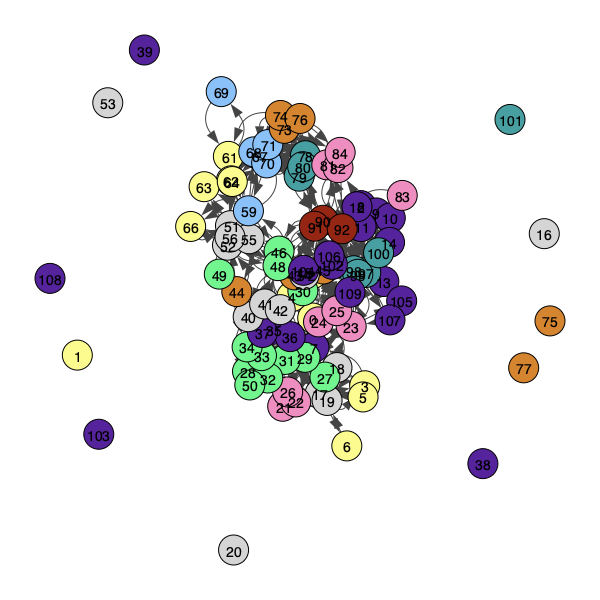

Room 0 has 7 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 8 tables (clones)
Room 5 has 5 tables (clones)
Room 6 has 3 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 5 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 4 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 3 tables (clones)
Room 15 has 9 tables (clones)
Room 16 has 2 tables (clones)
Room 17 has 5 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 110
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_50.pkl
decode C: (1, 116, 116)
decode T: (1, 116, 116)
decode Pi: (20,)
decode n_clones: [ 6  5  6  3  5  8  6  6  6  5  5  8  6  8  5  4  4  7 10  3]
decode C: (1, 116, 116)
decode T: (1, 116, 116)
decode Pi: (20,)
decode n_clones: [ 6  5  6  3  5  8  6  6  6  5  5  8  6  8  5  4  4  7 10  3]


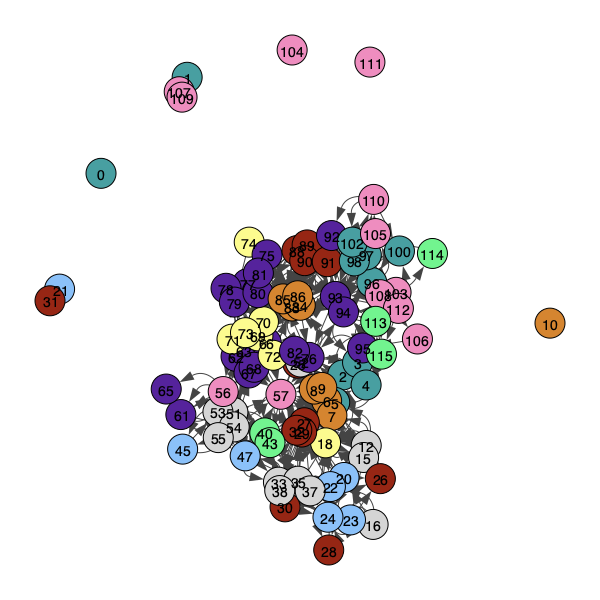

Room 0 has 6 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 3 tables (clones)
Room 4 has 5 tables (clones)
Room 5 has 8 tables (clones)
Room 6 has 6 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 5 tables (clones)
Room 10 has 5 tables (clones)
Room 11 has 8 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 8 tables (clones)
Room 14 has 5 tables (clones)
Room 15 has 4 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 10 tables (clones)
Room 19 has 3 tables (clones)
Total clones used: 116
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_60.pkl
decode C: (1, 109, 109)
decode T: (1, 109, 109)
decode Pi: (20,)
decode n_clones: [6 4 6 4 7 8 9 5 6 4 6 6 5 2 4 8 5 6 5 3]
decode C: (1, 109, 109)
decode T: (1, 109, 109)
decode Pi: (20,)
decode n_clones: [6 4 6 4 7 8 9 5 6 4 6 6 5 2 4 8 5 6 5 3]


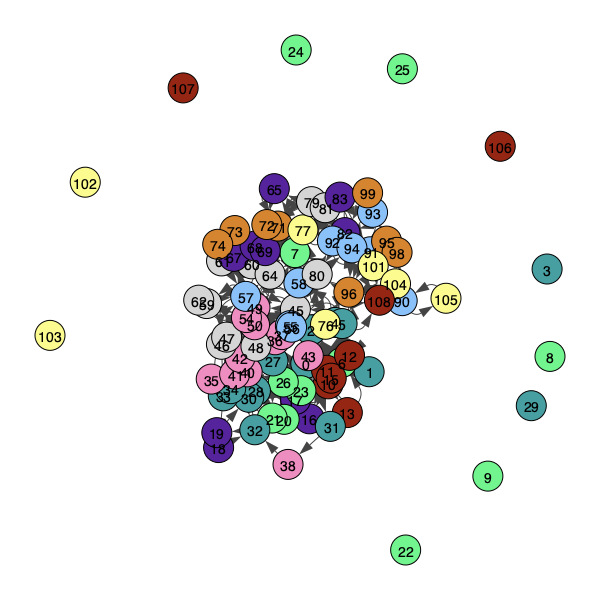

Room 0 has 6 tables (clones)
Room 1 has 4 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 8 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 5 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 4 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 5 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 6 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 3 tables (clones)
Total clones used: 109
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_70.pkl
decode C: (1, 123, 123)
decode T: (1, 123, 123)
decode Pi: (20,)
decode n_clones: [ 6 10  9  7  9  5  9  4  5  9  6  4  3  5  5  6  4  4  5  8]
decode C: (1, 123, 123)
decode T: (1, 123, 123)
decode Pi: (20,)
decode n_clones: [ 6 10  9  7  9  5  9  4  5  9  6  4  3  5  5  6  4  4  5  8]


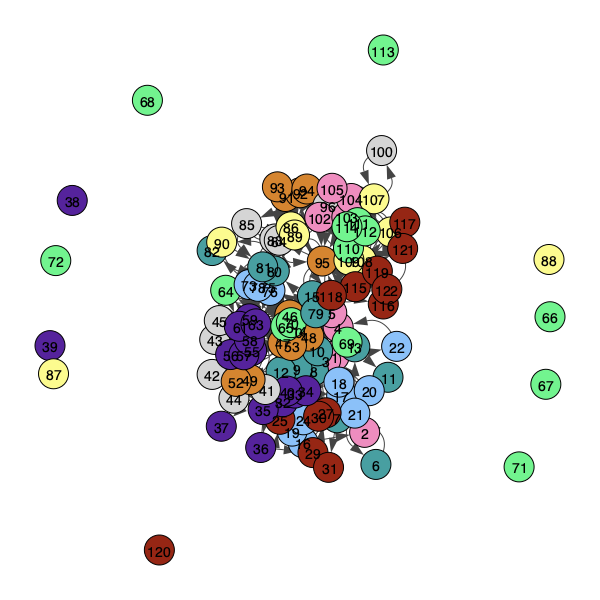

Room 0 has 6 tables (clones)
Room 1 has 10 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 7 tables (clones)
Room 4 has 9 tables (clones)
Room 5 has 5 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 5 tables (clones)
Room 9 has 9 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 4 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 5 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 4 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 123
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_80.pkl
decode C: (1, 117, 117)
decode T: (1, 117, 117)
decode Pi: (20,)
decode n_clones: [5 6 9 3 6 6 6 4 8 6 3 6 8 5 9 6 7 2 5 7]
decode C: (1, 117, 117)
decode T: (1, 117, 117)
decode Pi: (20,)
decode n_clones: [5 6 9 3 6 6 6 4 8 6 3 6 8 5 9 6 7 2 5 7]


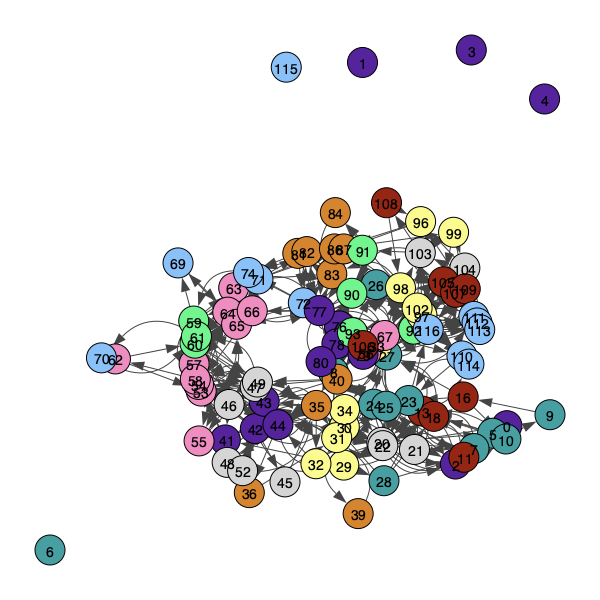

Room 0 has 5 tables (clones)
Room 1 has 6 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 3 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 6 tables (clones)
Room 6 has 6 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 8 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 3 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 8 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 9 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 2 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 7 tables (clones)
Total clones used: 117
Clones that would have been used by the original code: 100
model_lattice_alpha_0.4_seed_90.pkl
decode C: (1, 112, 112)
decode T: (1, 112, 112)
decode Pi: (20,)
decode n_clones: [6 3 4 6 3 4 7 7 9 3 5 5 6 5 9 8 5 6 6 5]
decode C: (1, 112, 112)
decode T: (1, 112, 112)
decode Pi: (20,)
decode n_clones: [6 3 4 6 3 4 7 7 9 3 5 5 6 5 9 8 5 6 6 5]


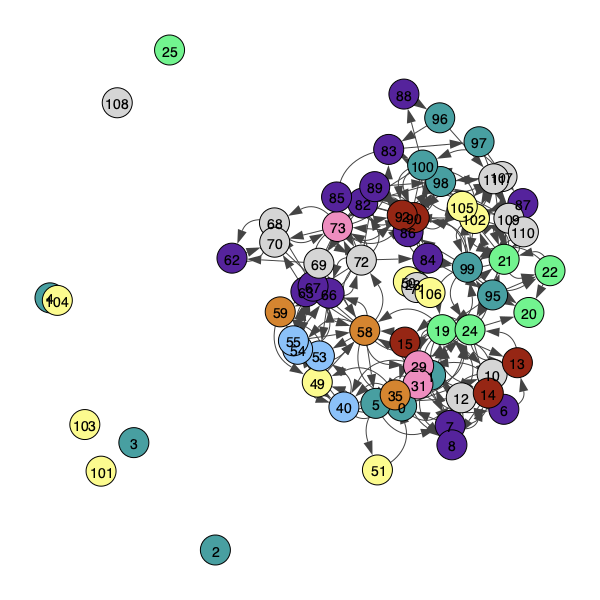

Room 0 has 6 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 4 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 3 tables (clones)
Room 5 has 4 tables (clones)
Room 6 has 7 tables (clones)
Room 7 has 7 tables (clones)
Room 8 has 9 tables (clones)
Room 9 has 3 tables (clones)
Room 10 has 5 tables (clones)
Room 11 has 5 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 9 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 6 tables (clones)
Room 18 has 6 tables (clones)
Room 19 has 5 tables (clones)
Total clones used: 112
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_0.pkl
decode C: (1, 126, 126)
decode T: (1, 126, 126)
decode Pi: (20,)
decode n_clones: [12  5 12 10  7  5  5  3  4  5  4  4  6  4  3  6  7  7  9  8]
decode C: (1, 126, 126)
decode T: (1, 126, 126)
decode Pi: (20,)
decode n_clones: [12  5 12 10  7  5  5  3  4  5  4  4  6  4  3  6  7  7  9  8]


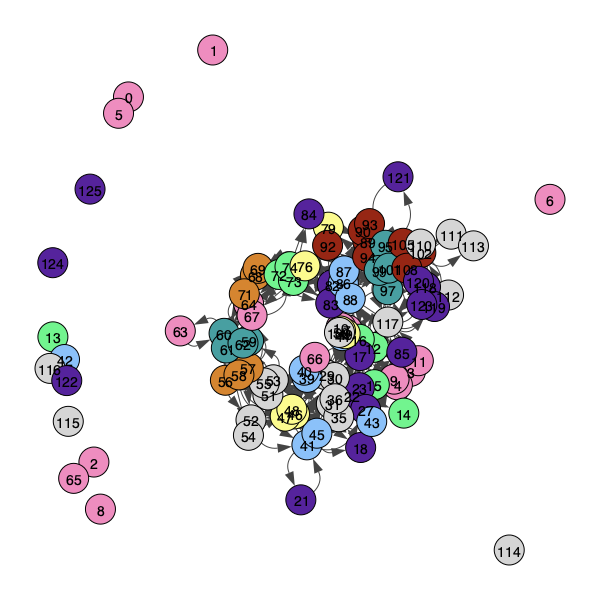

Room 0 has 12 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 12 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 5 tables (clones)
Room 6 has 5 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 4 tables (clones)
Room 9 has 5 tables (clones)
Room 10 has 4 tables (clones)
Room 11 has 4 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 4 tables (clones)
Room 14 has 3 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 9 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 126
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_10.pkl
decode C: (1, 144, 144)
decode T: (1, 144, 144)
decode Pi: (20,)
decode n_clones: [ 7  4  6  8  4  4  8  4  9  6  8 11  9  7  7 10 10  7 11  4]
decode C: (1, 144, 144)
decode T: (1, 144, 144)
decode Pi: (20,)
decode n_clones: [ 7  4  6  8  4  4  8  4  9  6  8 11  9  7  7 10 10  7 11  4]


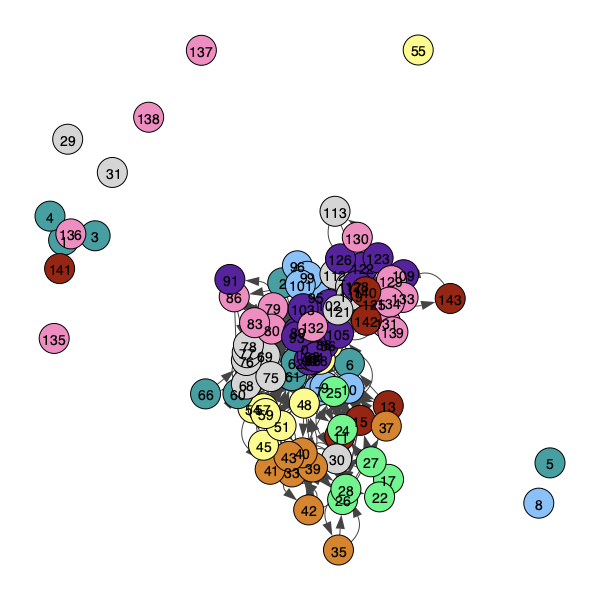

Room 0 has 7 tables (clones)
Room 1 has 4 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 8 tables (clones)
Room 4 has 4 tables (clones)
Room 5 has 4 tables (clones)
Room 6 has 8 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 9 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 8 tables (clones)
Room 11 has 11 tables (clones)
Room 12 has 9 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 10 tables (clones)
Room 16 has 10 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 11 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 144
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_20.pkl
decode C: (1, 142, 142)
decode T: (1, 142, 142)
decode Pi: (20,)
decode n_clones: [ 5  3 10  8  6  7  5  8  8  5  3  9  6 11  8  9  8  8  4 11]
decode C: (1, 142, 142)
decode T: (1, 142, 142)
decode Pi: (20,)
decode n_clones: [ 5  3 10  8  6  7  5  8  8  5  3  9  6 11  8  9  8  8  4 11]


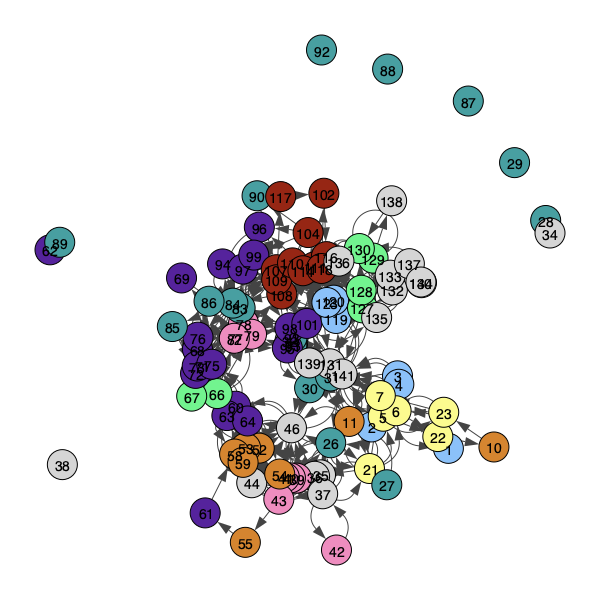

Room 0 has 5 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 10 tables (clones)
Room 3 has 8 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 7 tables (clones)
Room 6 has 5 tables (clones)
Room 7 has 8 tables (clones)
Room 8 has 8 tables (clones)
Room 9 has 5 tables (clones)
Room 10 has 3 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 11 tables (clones)
Room 14 has 8 tables (clones)
Room 15 has 9 tables (clones)
Room 16 has 8 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 4 tables (clones)
Room 19 has 11 tables (clones)
Total clones used: 142
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_30.pkl
decode C: (1, 145, 145)
decode T: (1, 145, 145)
decode Pi: (20,)
decode n_clones: [ 7 10  8 10  7  9  5  4  5 11 12  9  5  5  8  6  8  7  3  6]
decode C: (1, 145, 145)
decode T: (1, 145, 145)
decode Pi: (20,)
decode n_clones: [ 7 10  8 10  7  9  5  4  5 11 12  9  5  5  8  6  8  7  3  6]


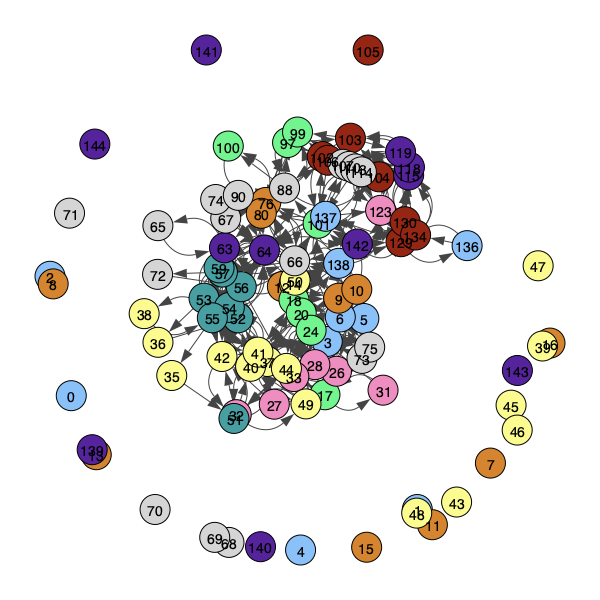

Room 0 has 7 tables (clones)
Room 1 has 10 tables (clones)
Room 2 has 8 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 9 tables (clones)
Room 6 has 5 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 5 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 12 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 5 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 8 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 8 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 145
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_40.pkl
decode C: (1, 131, 131)
decode T: (1, 131, 131)
decode Pi: (20,)
decode n_clones: [10  4  8  4  5  6  5  3  7  7  6  3  9  6  6  9  7 10  9  7]
decode C: (1, 131, 131)
decode T: (1, 131, 131)
decode Pi: (20,)
decode n_clones: [10  4  8  4  5  6  5  3  7  7  6  3  9  6  6  9  7 10  9  7]


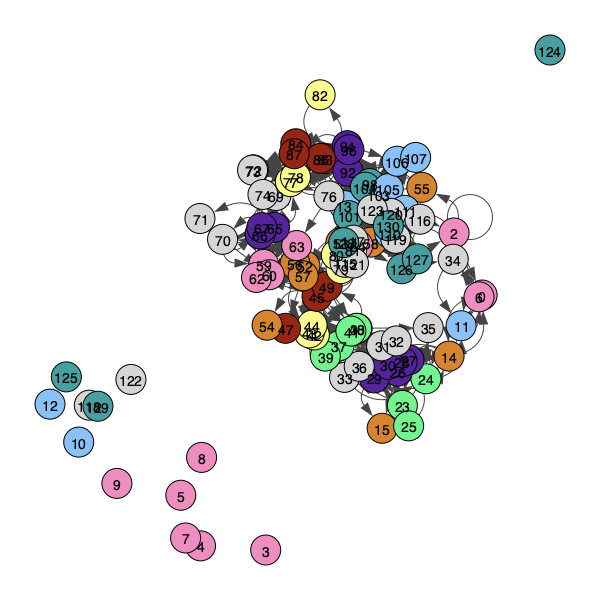

Room 0 has 10 tables (clones)
Room 1 has 4 tables (clones)
Room 2 has 8 tables (clones)
Room 3 has 4 tables (clones)
Room 4 has 5 tables (clones)
Room 5 has 6 tables (clones)
Room 6 has 5 tables (clones)
Room 7 has 3 tables (clones)
Room 8 has 7 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 9 tables (clones)
Room 13 has 6 tables (clones)
Room 14 has 6 tables (clones)
Room 15 has 9 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 10 tables (clones)
Room 18 has 9 tables (clones)
Room 19 has 7 tables (clones)
Total clones used: 131
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_50.pkl
decode C: (1, 143, 143)
decode T: (1, 143, 143)
decode Pi: (20,)
decode n_clones: [ 6  6 12  7  6  8  5  6  9 11  9 10  7  6  7  6  3  8  5  6]
decode C: (1, 143, 143)
decode T: (1, 143, 143)
decode Pi: (20,)
decode n_clones: [ 6  6 12  7  6  8  5  6  9 11  9 10  7  6  7  6  3  8  5  6]


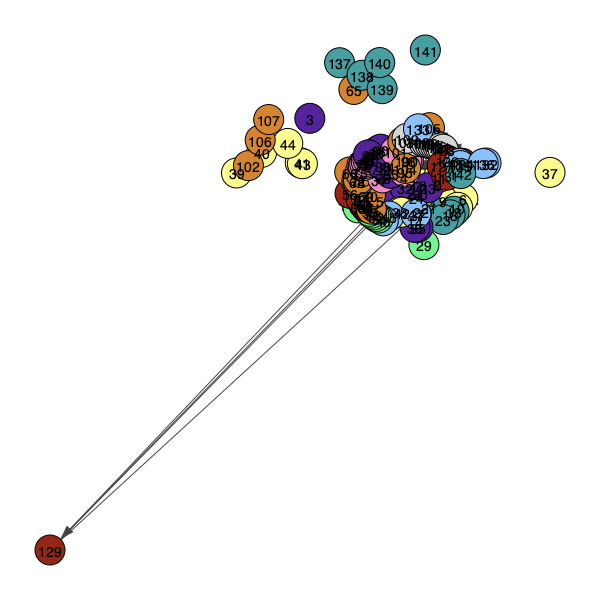

Room 0 has 6 tables (clones)
Room 1 has 6 tables (clones)
Room 2 has 12 tables (clones)
Room 3 has 7 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 8 tables (clones)
Room 6 has 5 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 9 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 10 tables (clones)
Room 12 has 7 tables (clones)
Room 13 has 6 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 3 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 143
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_60.pkl
decode C: (1, 135, 135)
decode T: (1, 135, 135)
decode Pi: (20,)
decode n_clones: [ 6  5  8  6  5  6  9  8 13  8  6  9  3  6  8  5  4  9  5  6]
decode C: (1, 135, 135)
decode T: (1, 135, 135)
decode Pi: (20,)
decode n_clones: [ 6  5  8  6  5  6  9  8 13  8  6  9  3  6  8  5  4  9  5  6]


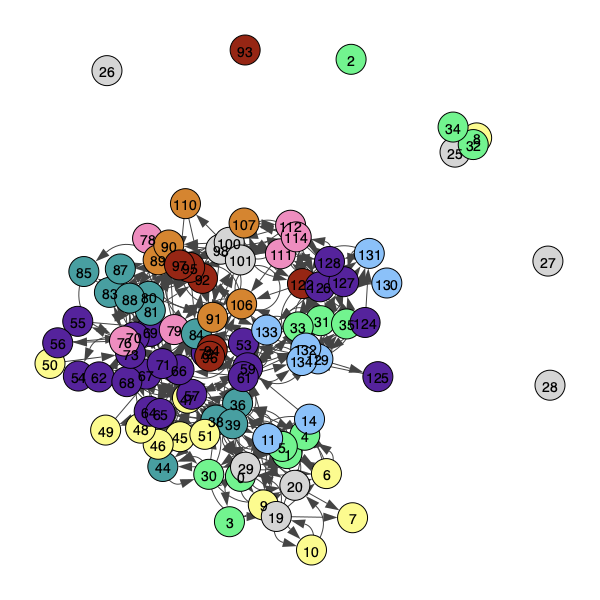

Room 0 has 6 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 8 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 5 tables (clones)
Room 5 has 6 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 8 tables (clones)
Room 8 has 13 tables (clones)
Room 9 has 8 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 6 tables (clones)
Room 14 has 8 tables (clones)
Room 15 has 5 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 9 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 135
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_70.pkl
decode C: (1, 124, 124)
decode T: (1, 124, 124)
decode Pi: (20,)
decode n_clones: [ 5 11 10  6  7  3 10  8  2  6  2  3 10  5  4  7  7  7 10  1]
decode C: (1, 124, 124)
decode T: (1, 124, 124)
decode Pi: (20,)
decode n_clones: [ 5 11 10  6  7  3 10  8  2  6  2  3 10  5  4  7  7  7 10  1]


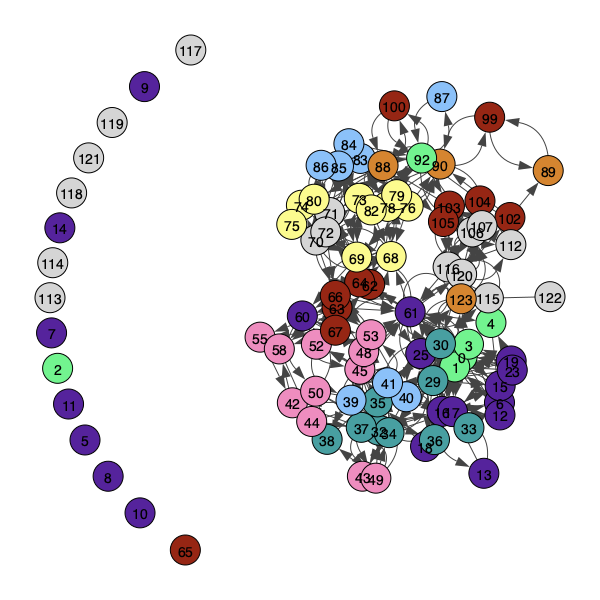

Room 0 has 5 tables (clones)
Room 1 has 11 tables (clones)
Room 2 has 10 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 3 tables (clones)
Room 6 has 10 tables (clones)
Room 7 has 8 tables (clones)
Room 8 has 2 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 2 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 10 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 7 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 10 tables (clones)
Room 19 has 1 tables (clones)
Total clones used: 124
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_80.pkl
decode C: (1, 135, 135)
decode T: (1, 135, 135)
decode Pi: (20,)
decode n_clones: [ 9  6  2  9  7  8  9  6 10  7  3  7  6  9  8  3  7  7  6  6]
decode C: (1, 135, 135)
decode T: (1, 135, 135)
decode Pi: (20,)
decode n_clones: [ 9  6  2  9  7  8  9  6 10  7  3  7  6  9  8  3  7  7  6  6]

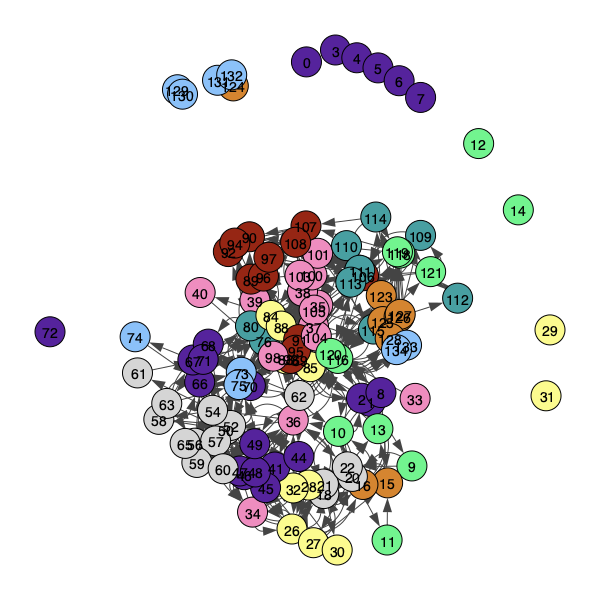

Room 0 has 9 tables (clones)
Room 1 has 6 tables (clones)
Room 2 has 2 tables (clones)
Room 3 has 9 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 8 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 10 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 3 tables (clones)
Room 11 has 7 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 9 tables (clones)
Room 14 has 8 tables (clones)
Room 15 has 3 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 6 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 135
Clones that would have been used by the original code: 100
model_lattice_alpha_0.5_seed_90.pkl
decode C: (1, 146, 146)
decode T: (1, 146, 146)
decode Pi: (20,)
decode n_clones: [ 8  3  6 10  5 10  7  8  7  5  9  8  4  5  9  9  8  9  5 11]
decode C: (1, 146, 146)
decode T: (1, 146, 146)
decode Pi: (20,)
decode n_clones: [ 8  3  6 10  5 10  7  8  7  5  9  8  4  5  9  9  8  9  5 11]


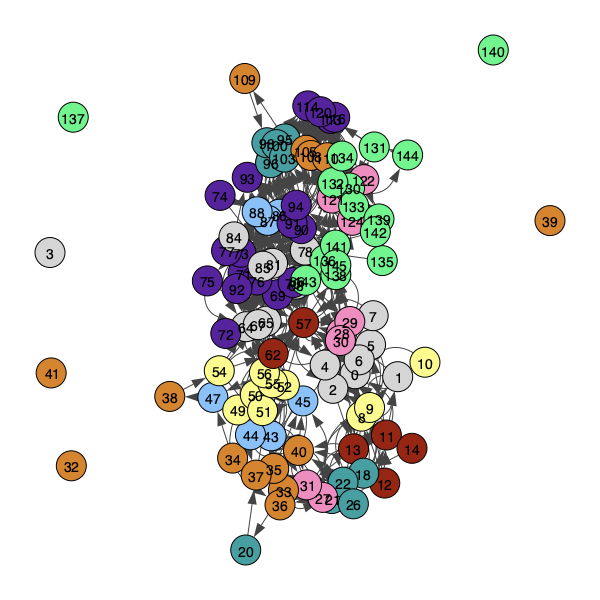

Room 0 has 8 tables (clones)
Room 1 has 3 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 5 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 7 tables (clones)
Room 7 has 8 tables (clones)
Room 8 has 7 tables (clones)
Room 9 has 5 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 8 tables (clones)
Room 12 has 4 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 9 tables (clones)
Room 15 has 9 tables (clones)
Room 16 has 8 tables (clones)
Room 17 has 9 tables (clones)
Room 18 has 5 tables (clones)
Room 19 has 11 tables (clones)
Total clones used: 146
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_0.pkl
decode C: (1, 172, 172)
decode T: (1, 172, 172)
decode Pi: (20,)
decode n_clones: [ 7  5  9  6 16  6  7  9 13 11  7 10 15  8  7 10  8  7  7  4]
decode C: (1, 172, 172)
decode T: (1, 172, 172)
decode Pi: (20,)
decode n_clones: [ 7  5  9  6 16  6  7  9 13 11  7 10 15  8  7 10  8  7  7  4]


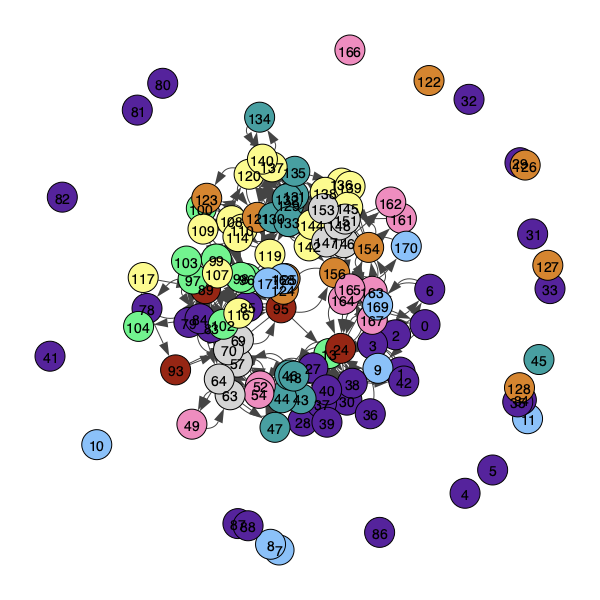

Room 0 has 7 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 16 tables (clones)
Room 5 has 6 tables (clones)
Room 6 has 7 tables (clones)
Room 7 has 9 tables (clones)
Room 8 has 13 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 7 tables (clones)
Room 11 has 10 tables (clones)
Room 12 has 15 tables (clones)
Room 13 has 8 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 10 tables (clones)
Room 16 has 8 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 7 tables (clones)
Room 19 has 4 tables (clones)
Total clones used: 172
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_10.pkl
decode C: (1, 147, 147)
decode T: (1, 147, 147)
decode Pi: (20,)
decode n_clones: [ 7  8  8  5  7  6  9  5  8 10 14  9  3  3  7  8  7  7 10  6]
decode C: (1, 147, 147)
decode T: (1, 147, 147)
decode Pi: (20,)
decode n_clones: [ 7  8  8  5  7  6  9  5  8 10 14  9  3  3  7  8  7  7 10  6

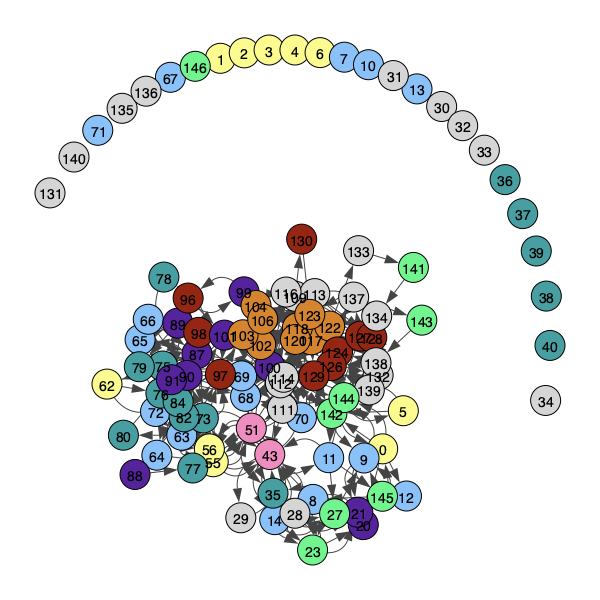

Room 0 has 7 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 8 tables (clones)
Room 3 has 5 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 6 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 5 tables (clones)
Room 8 has 8 tables (clones)
Room 9 has 10 tables (clones)
Room 10 has 14 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 3 tables (clones)
Room 13 has 3 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 10 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 147
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_20.pkl
decode C: (1, 157, 157)
decode T: (1, 157, 157)
decode Pi: (20,)
decode n_clones: [10  7  6 11 11  7 12  4  8  6  7  7  8  9  4  5  6 10 10  9]
decode C: (1, 157, 157)
decode T: (1, 157, 157)
decode Pi: (20,)
decode n_clones: [10  7  6 11 11  7 12  4  8  6  7  7  8  9  4  5  6 10 10  9]


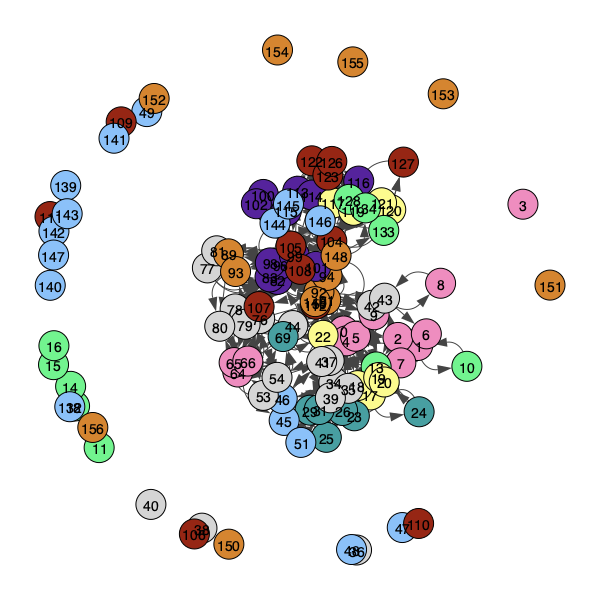

Room 0 has 10 tables (clones)
Room 1 has 7 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 11 tables (clones)
Room 4 has 11 tables (clones)
Room 5 has 7 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 4 tables (clones)
Room 8 has 8 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 7 tables (clones)
Room 11 has 7 tables (clones)
Room 12 has 8 tables (clones)
Room 13 has 9 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 5 tables (clones)
Room 16 has 6 tables (clones)
Room 17 has 10 tables (clones)
Room 18 has 10 tables (clones)
Room 19 has 9 tables (clones)
Total clones used: 157
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_30.pkl
decode C: (1, 164, 164)
decode T: (1, 164, 164)
decode Pi: (20,)
decode n_clones: [ 8  9  8  5 10 13  6  5  9  8  8  9  7 12  9 10 11  7  4  6]
decode C: (1, 164, 164)
decode T: (1, 164, 164)
decode Pi: (20,)
decode n_clones: [ 8  9  8  5 10 13  6  5  9  8  8  9  7 12  9 10 11  7  4  6

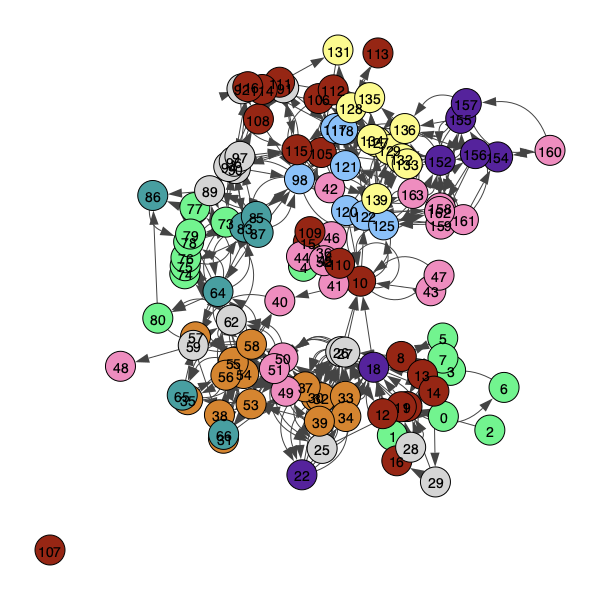

Room 0 has 8 tables (clones)
Room 1 has 9 tables (clones)
Room 2 has 8 tables (clones)
Room 3 has 5 tables (clones)
Room 4 has 10 tables (clones)
Room 5 has 13 tables (clones)
Room 6 has 6 tables (clones)
Room 7 has 5 tables (clones)
Room 8 has 9 tables (clones)
Room 9 has 8 tables (clones)
Room 10 has 8 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 7 tables (clones)
Room 13 has 12 tables (clones)
Room 14 has 9 tables (clones)
Room 15 has 10 tables (clones)
Room 16 has 11 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 4 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 164
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_40.pkl
decode C: (1, 142, 142)
decode T: (1, 142, 142)
decode Pi: (20,)
decode n_clones: [ 6  8 10  5  4  6  7  6  8  8  8  6  6  9  5  9  4  7  6 14]
decode C: (1, 142, 142)
decode T: (1, 142, 142)
decode Pi: (20,)
decode n_clones: [ 6  8 10  5  4  6  7  6  8  8  8  6  6  9  5  9  4  7  6 14]

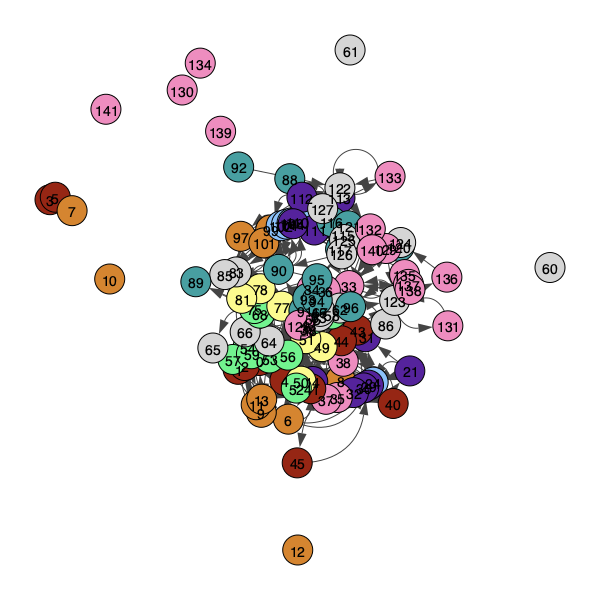

Room 0 has 6 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 10 tables (clones)
Room 3 has 5 tables (clones)
Room 4 has 4 tables (clones)
Room 5 has 6 tables (clones)
Room 6 has 7 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 8 tables (clones)
Room 9 has 8 tables (clones)
Room 10 has 8 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 9 tables (clones)
Room 14 has 5 tables (clones)
Room 15 has 9 tables (clones)
Room 16 has 4 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 6 tables (clones)
Room 19 has 14 tables (clones)
Total clones used: 142
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_50.pkl
decode C: (1, 163, 163)
decode T: (1, 163, 163)
decode Pi: (20,)
decode n_clones: [ 7  8  9  7  8  7  7  9  9 10 12 11  6  5  7  6  8 11  9  7]
decode C: (1, 163, 163)
decode T: (1, 163, 163)
decode Pi: (20,)
decode n_clones: [ 7  8  9  7  8  7  7  9  9 10 12 11  6  5  7  6  8 11  9  7]


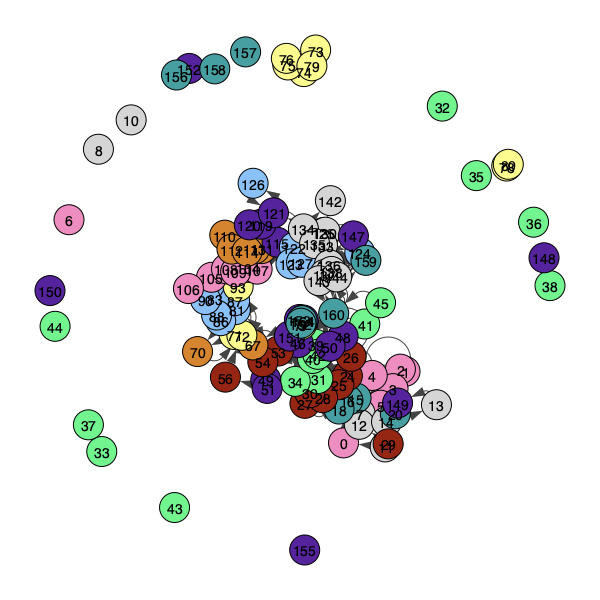

Room 0 has 7 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 7 tables (clones)
Room 4 has 8 tables (clones)
Room 5 has 7 tables (clones)
Room 6 has 7 tables (clones)
Room 7 has 9 tables (clones)
Room 8 has 9 tables (clones)
Room 9 has 10 tables (clones)
Room 10 has 12 tables (clones)
Room 11 has 11 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 5 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 8 tables (clones)
Room 17 has 11 tables (clones)
Room 18 has 9 tables (clones)
Room 19 has 7 tables (clones)
Total clones used: 163
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_60.pkl
decode C: (1, 147, 147)
decode T: (1, 147, 147)
decode Pi: (20,)
decode n_clones: [ 8  4  5 12  6 11  6  8  4  5  6  8  7  9  5  9  7  7 11  9]
decode C: (1, 147, 147)
decode T: (1, 147, 147)
decode Pi: (20,)
decode n_clones: [ 8  4  5 12  6 11  6  8  4  5  6  8  7  9  5  9  7  7 11  9]


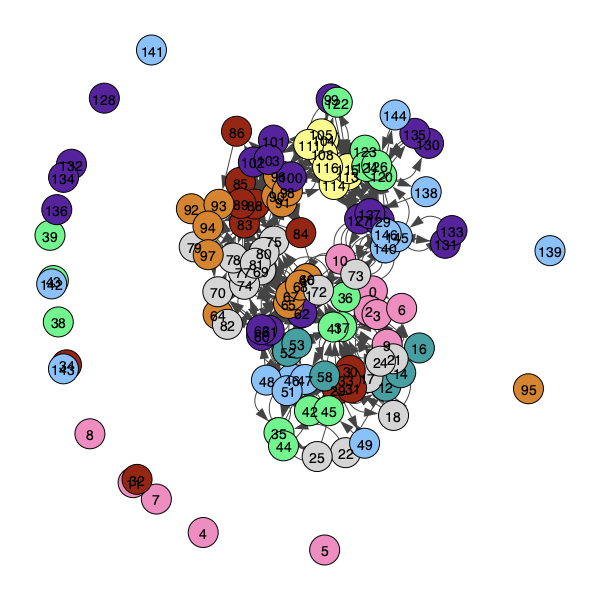

Room 0 has 8 tables (clones)
Room 1 has 4 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 12 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 11 tables (clones)
Room 6 has 6 tables (clones)
Room 7 has 8 tables (clones)
Room 8 has 4 tables (clones)
Room 9 has 5 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 8 tables (clones)
Room 12 has 7 tables (clones)
Room 13 has 9 tables (clones)
Room 14 has 5 tables (clones)
Room 15 has 9 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 11 tables (clones)
Room 19 has 9 tables (clones)
Total clones used: 147
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_70.pkl
decode C: (1, 153, 153)
decode T: (1, 153, 153)
decode Pi: (20,)
decode n_clones: [10  7  9  2  6  9  7  6  8  9  8  6  4 10  7  6 12  9  9  9]
decode C: (1, 153, 153)
decode T: (1, 153, 153)
decode Pi: (20,)
decode n_clones: [10  7  9  2  6  9  7  6  8  9  8  6  4 10  7  6 12  9  9  9]


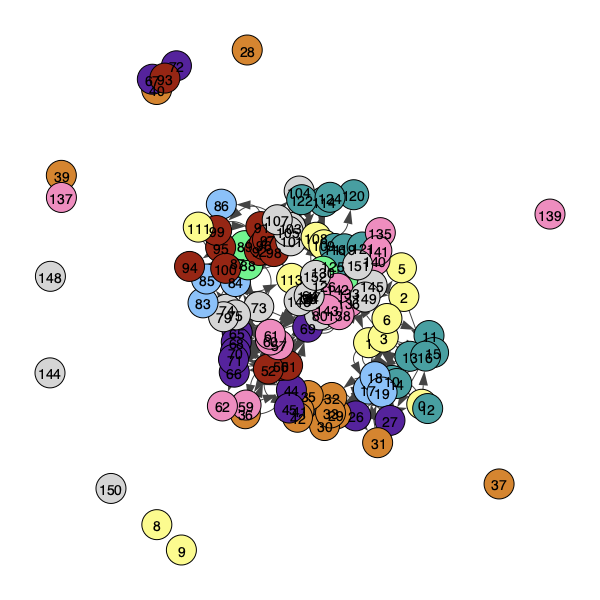

Room 0 has 10 tables (clones)
Room 1 has 7 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 2 tables (clones)
Room 4 has 6 tables (clones)
Room 5 has 9 tables (clones)
Room 6 has 7 tables (clones)
Room 7 has 6 tables (clones)
Room 8 has 8 tables (clones)
Room 9 has 9 tables (clones)
Room 10 has 8 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 4 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 12 tables (clones)
Room 17 has 9 tables (clones)
Room 18 has 9 tables (clones)
Room 19 has 9 tables (clones)
Total clones used: 153
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_80.pkl
decode C: (1, 136, 136)
decode T: (1, 136, 136)
decode Pi: (20,)
decode n_clones: [ 7  5  5  6  8  7  9  7  4 10 10  3 12  2  7  8 10  6  3  7]
decode C: (1, 136, 136)
decode T: (1, 136, 136)
decode Pi: (20,)
decode n_clones: [ 7  5  5  6  8  7  9  7  4 10 10  3 12  2  7  8 10  6  3  7]


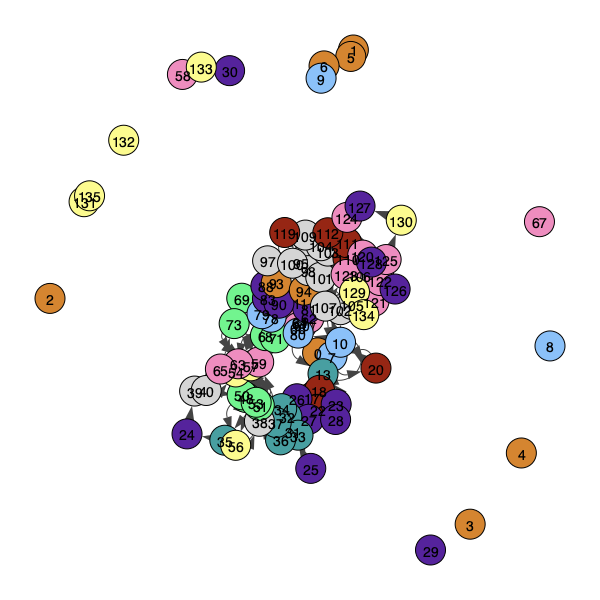

Room 0 has 7 tables (clones)
Room 1 has 5 tables (clones)
Room 2 has 5 tables (clones)
Room 3 has 6 tables (clones)
Room 4 has 8 tables (clones)
Room 5 has 7 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 7 tables (clones)
Room 8 has 4 tables (clones)
Room 9 has 10 tables (clones)
Room 10 has 10 tables (clones)
Room 11 has 3 tables (clones)
Room 12 has 12 tables (clones)
Room 13 has 2 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 10 tables (clones)
Room 17 has 6 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 7 tables (clones)
Total clones used: 136
Clones that would have been used by the original code: 100
model_lattice_alpha_0.6_seed_90.pkl
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


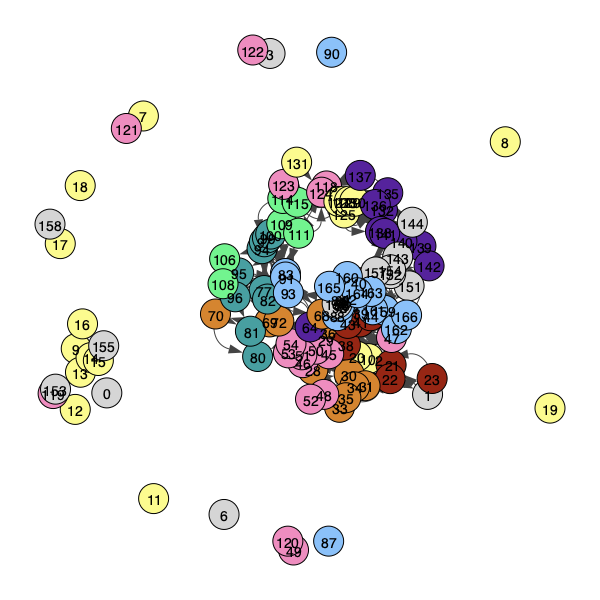

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


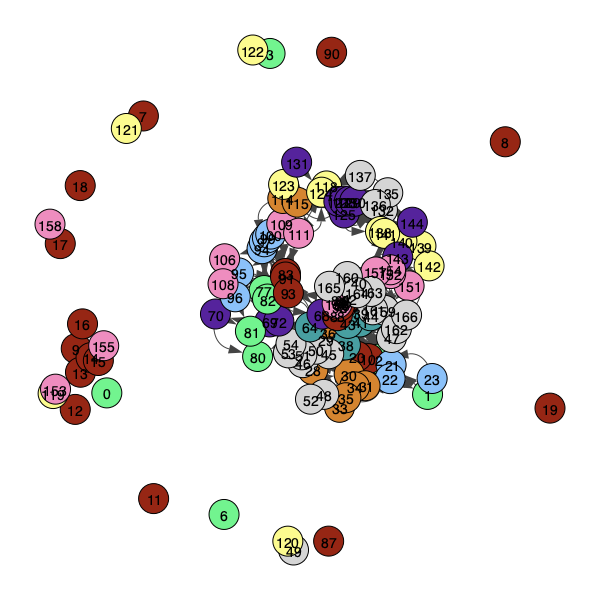

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


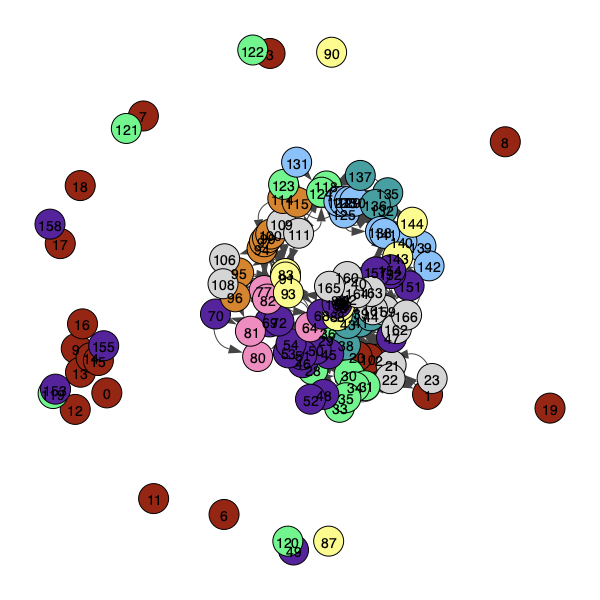

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


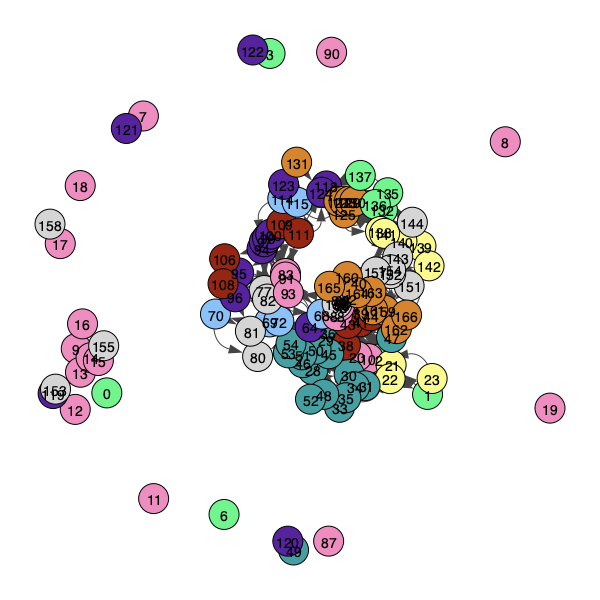

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


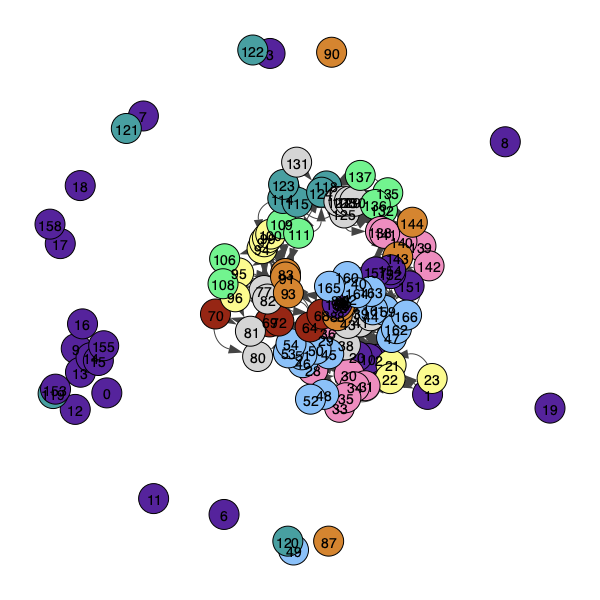

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


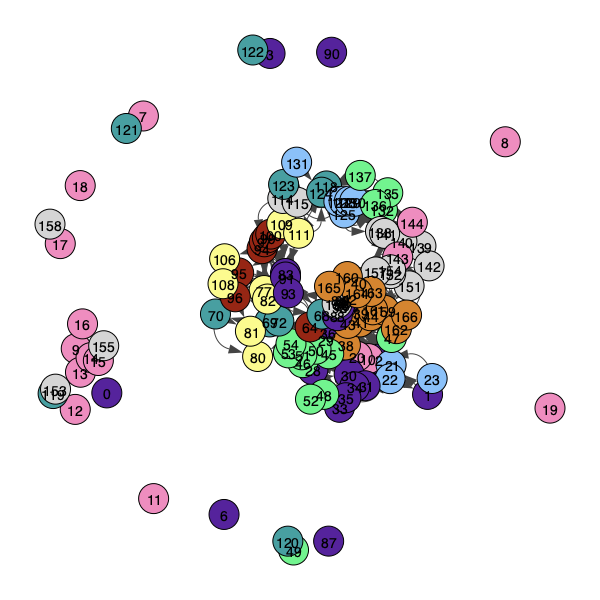

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


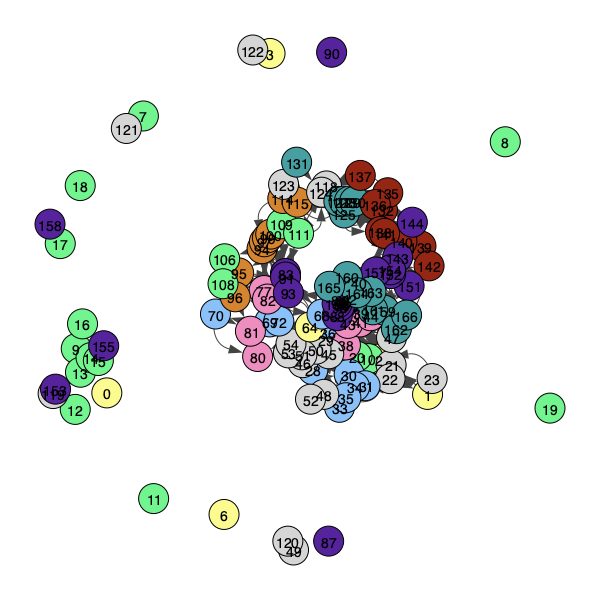

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


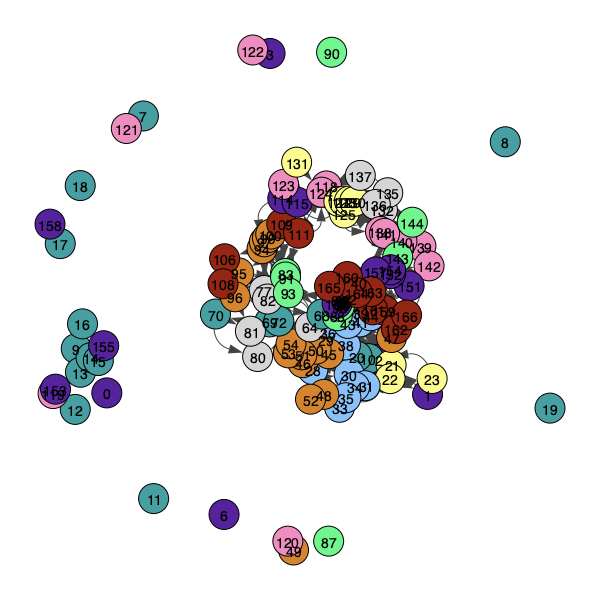

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


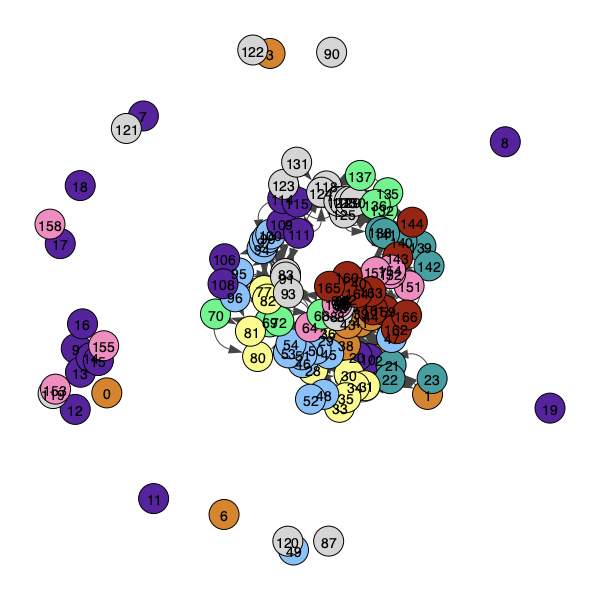

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


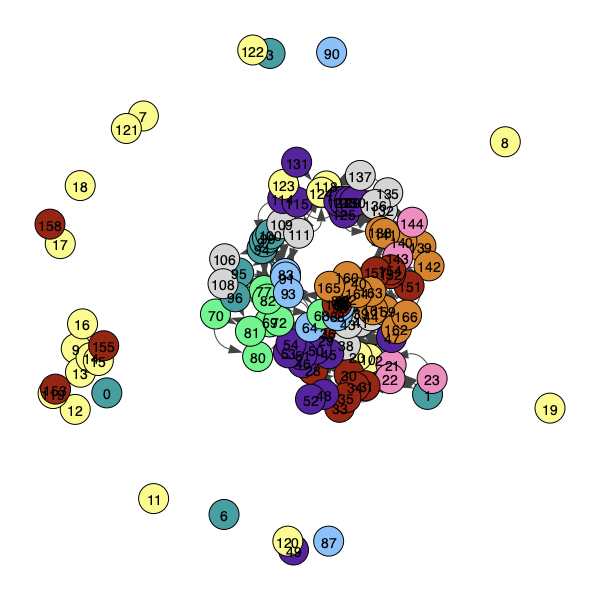

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]
decode C: (1, 167, 167)
decode T: (1, 167, 167)
decode Pi: (20,)
decode n_clones: [ 7 14  7 10  7 10 12 10  6 11  9  9  6  7  7  6  5  8  8  8]


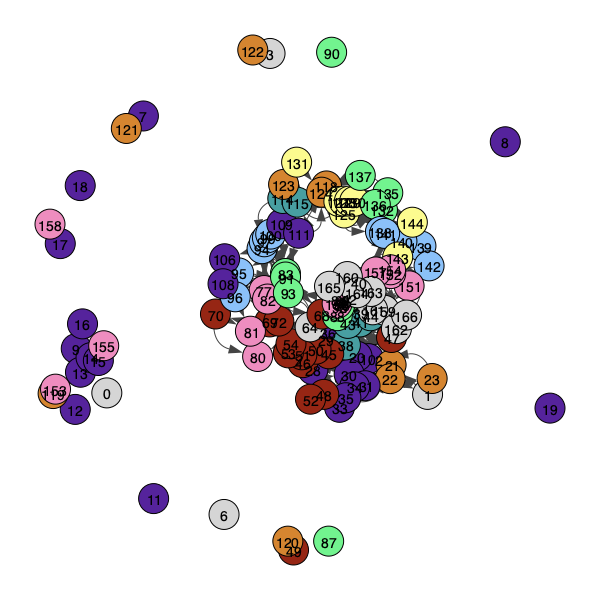

Room 0 has 7 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 10 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 6 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 6 tables (clones)
Room 13 has 7 tables (clones)
Room 14 has 7 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 5 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 8 tables (clones)
Total clones used: 167
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_0.pkl
decode C: (1, 206, 206)
decode T: (1, 206, 206)
decode Pi: (20,)
decode n_clones: [13 14  7  8  9 11 16  7 14  7 10  8  8 10 15 11 13  8  7 10]
decode C: (1, 206, 206)
decode T: (1, 206, 206)
decode Pi: (20,)
decode n_clones: [13 14  7  8  9 11 16  7 14  7 10  8  8 10 15 11 13  8  7 10]

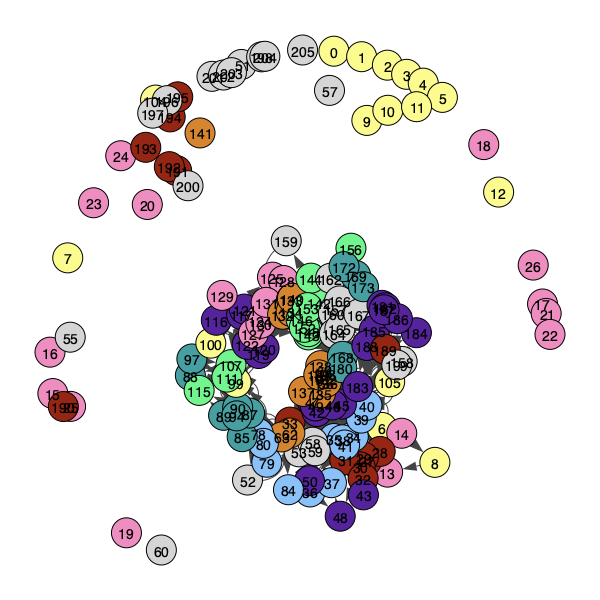

Room 0 has 13 tables (clones)
Room 1 has 14 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 8 tables (clones)
Room 4 has 9 tables (clones)
Room 5 has 11 tables (clones)
Room 6 has 16 tables (clones)
Room 7 has 7 tables (clones)
Room 8 has 14 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 10 tables (clones)
Room 11 has 8 tables (clones)
Room 12 has 8 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 15 tables (clones)
Room 15 has 11 tables (clones)
Room 16 has 13 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 7 tables (clones)
Room 19 has 10 tables (clones)
Total clones used: 206
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_10.pkl
decode C: (1, 194, 194)
decode T: (1, 194, 194)
decode Pi: (20,)
decode n_clones: [17 11 10 11  3  3 16 10  9 12 10 11  4  8 11  8 13  8  8 11]
decode C: (1, 194, 194)
decode T: (1, 194, 194)
decode Pi: (20,)
decode n_clones: [17 11 10 11  3  3 16 10  9 12 10 11  4  8 11  8 13  8 

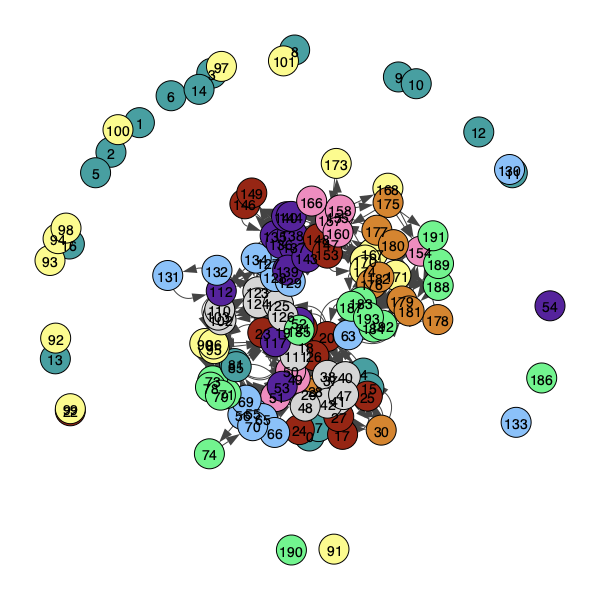

Room 0 has 17 tables (clones)
Room 1 has 11 tables (clones)
Room 2 has 10 tables (clones)
Room 3 has 11 tables (clones)
Room 4 has 3 tables (clones)
Room 5 has 3 tables (clones)
Room 6 has 16 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 9 tables (clones)
Room 9 has 12 tables (clones)
Room 10 has 10 tables (clones)
Room 11 has 11 tables (clones)
Room 12 has 4 tables (clones)
Room 13 has 8 tables (clones)
Room 14 has 11 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 13 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 11 tables (clones)
Total clones used: 194
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_20.pkl
decode C: (1, 233, 233)
decode T: (1, 233, 233)
decode Pi: (20,)
decode n_clones: [10 10  8 15 13 15 10 12 13  7  6 12 14 10 15 11 15 15 11 11]
decode C: (1, 233, 233)
decode T: (1, 233, 233)
decode Pi: (20,)
decode n_clones: [10 10  8 15 13 15 10 12 13  7  6 12 14 10 15 11 15 15

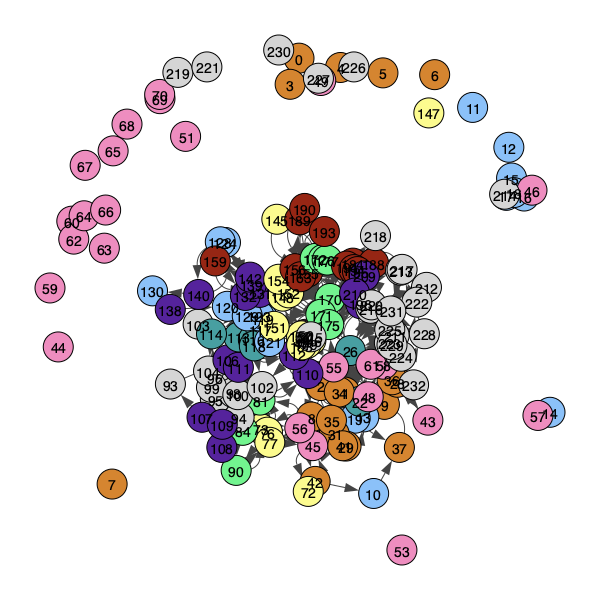

Room 0 has 10 tables (clones)
Room 1 has 10 tables (clones)
Room 2 has 8 tables (clones)
Room 3 has 15 tables (clones)
Room 4 has 13 tables (clones)
Room 5 has 15 tables (clones)
Room 6 has 10 tables (clones)
Room 7 has 12 tables (clones)
Room 8 has 13 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 12 tables (clones)
Room 12 has 14 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 15 tables (clones)
Room 15 has 11 tables (clones)
Room 16 has 15 tables (clones)
Room 17 has 15 tables (clones)
Room 18 has 11 tables (clones)
Room 19 has 11 tables (clones)
Total clones used: 233
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_30.pkl
decode C: (1, 198, 198)
decode T: (1, 198, 198)
decode Pi: (20,)
decode n_clones: [11  6 10  8 12 19 13 10 13  7 13  9  7  9  9 11  6  9 10  6]
decode C: (1, 198, 198)
decode T: (1, 198, 198)
decode Pi: (20,)
decode n_clones: [11  6 10  8 12 19 13 10 13  7 13  9  7  9  9 11 

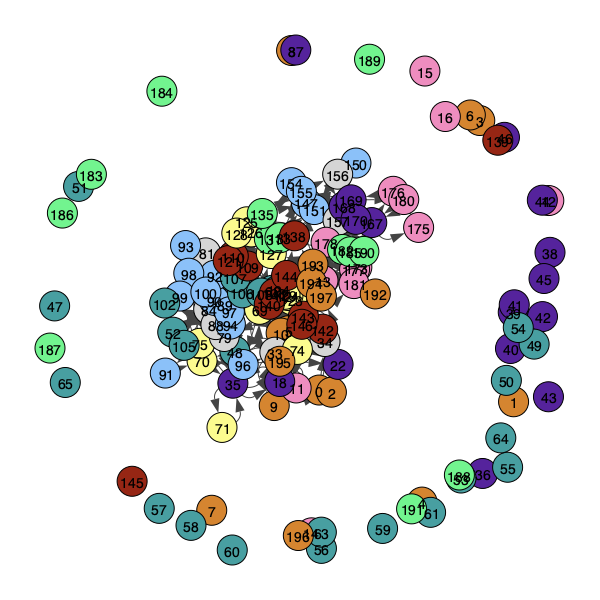

Room 0 has 11 tables (clones)
Room 1 has 6 tables (clones)
Room 2 has 10 tables (clones)
Room 3 has 8 tables (clones)
Room 4 has 12 tables (clones)
Room 5 has 19 tables (clones)
Room 6 has 13 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 13 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 13 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 7 tables (clones)
Room 13 has 9 tables (clones)
Room 14 has 9 tables (clones)
Room 15 has 11 tables (clones)
Room 16 has 6 tables (clones)
Room 17 has 9 tables (clones)
Room 18 has 10 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 198
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_40.pkl
decode C: (1, 228, 228)
decode T: (1, 228, 228)
decode Pi: (20,)
decode n_clones: [ 5 24  7 13 14  9 12 14  7  6 13 10 18  6 15 13 11 10  7 14]
decode C: (1, 228, 228)
decode T: (1, 228, 228)
decode Pi: (20,)
decode n_clones: [ 5 24  7 13 14  9 12 14  7  6 13 10 18  6 15 13 11 10  

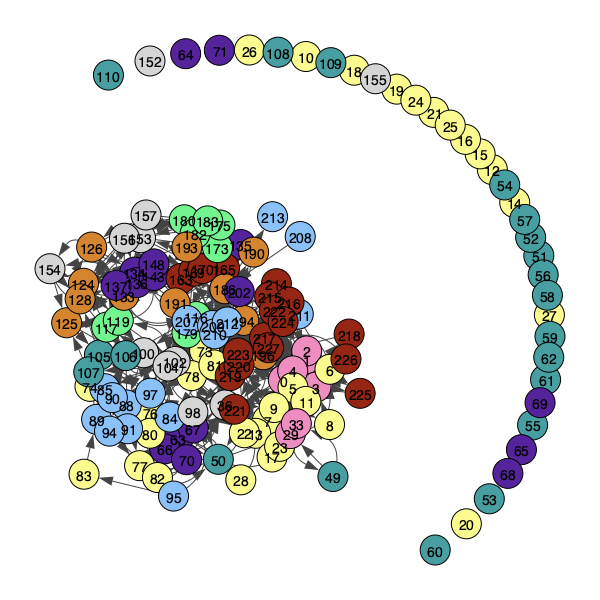

Room 0 has 5 tables (clones)
Room 1 has 24 tables (clones)
Room 2 has 7 tables (clones)
Room 3 has 13 tables (clones)
Room 4 has 14 tables (clones)
Room 5 has 9 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 14 tables (clones)
Room 8 has 7 tables (clones)
Room 9 has 6 tables (clones)
Room 10 has 13 tables (clones)
Room 11 has 10 tables (clones)
Room 12 has 18 tables (clones)
Room 13 has 6 tables (clones)
Room 14 has 15 tables (clones)
Room 15 has 13 tables (clones)
Room 16 has 11 tables (clones)
Room 17 has 10 tables (clones)
Room 18 has 7 tables (clones)
Room 19 has 14 tables (clones)
Total clones used: 228
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_50.pkl
decode C: (1, 195, 195)
decode T: (1, 195, 195)
decode Pi: (20,)
decode n_clones: [17  8 11  8 12  6 12 10 13  9  5  5  7 12 12  8  7  7 12 14]
decode C: (1, 195, 195)
decode T: (1, 195, 195)
decode Pi: (20,)
decode n_clones: [17  8 11  8 12  6 12 10 13  9  5  5  7 12 12  8  7  

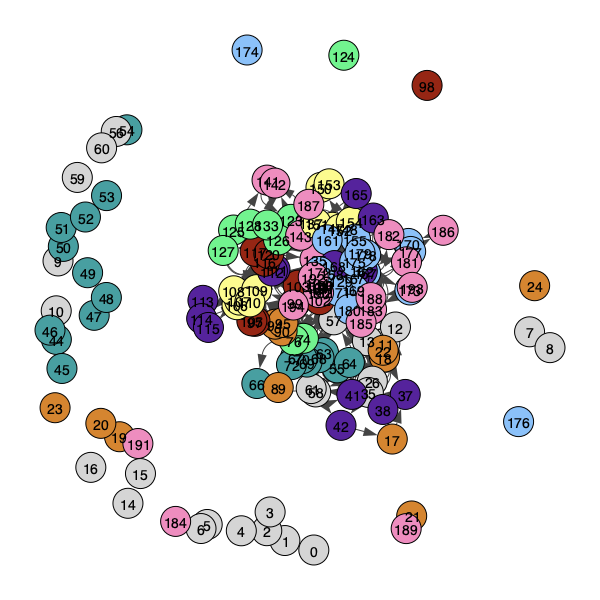

Room 0 has 17 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 11 tables (clones)
Room 3 has 8 tables (clones)
Room 4 has 12 tables (clones)
Room 5 has 6 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 13 tables (clones)
Room 9 has 9 tables (clones)
Room 10 has 5 tables (clones)
Room 11 has 5 tables (clones)
Room 12 has 7 tables (clones)
Room 13 has 12 tables (clones)
Room 14 has 12 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 7 tables (clones)
Room 18 has 12 tables (clones)
Room 19 has 14 tables (clones)
Total clones used: 195
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_60.pkl
decode C: (1, 183, 183)
decode T: (1, 183, 183)
decode Pi: (20,)
decode n_clones: [ 5  8  9 12 10  8  9  9  9 13 10  9 14 10  8  7 11 13  3  6]
decode C: (1, 183, 183)
decode T: (1, 183, 183)
decode Pi: (20,)
decode n_clones: [ 5  8  9 12 10  8  9  9  9 13 10  9 14 10  8  7 11 13  

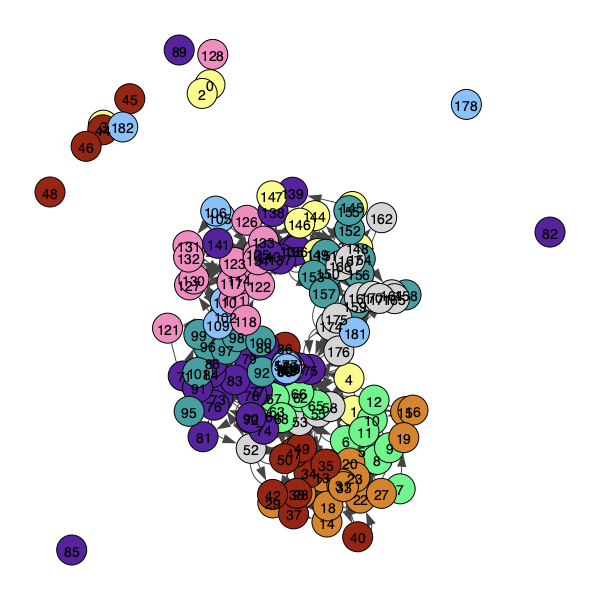

Room 0 has 5 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 12 tables (clones)
Room 4 has 10 tables (clones)
Room 5 has 8 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 9 tables (clones)
Room 8 has 9 tables (clones)
Room 9 has 13 tables (clones)
Room 10 has 10 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 14 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 8 tables (clones)
Room 15 has 7 tables (clones)
Room 16 has 11 tables (clones)
Room 17 has 13 tables (clones)
Room 18 has 3 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 183
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_70.pkl
decode C: (1, 213, 213)
decode T: (1, 213, 213)
decode Pi: (20,)
decode n_clones: [11 11 10  5  7 11 15  9 10  7 11 13  8  8 11 19 11  8 12 16]
decode C: (1, 213, 213)
decode T: (1, 213, 213)
decode Pi: (20,)
decode n_clones: [11 11 10  5  7 11 15  9 10  7 11 13  8  8 11 19 11  8 12 

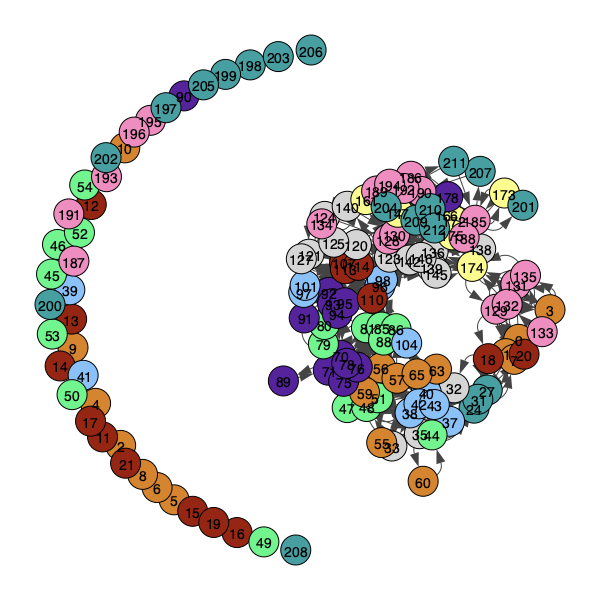

Room 0 has 11 tables (clones)
Room 1 has 11 tables (clones)
Room 2 has 10 tables (clones)
Room 3 has 5 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 11 tables (clones)
Room 6 has 15 tables (clones)
Room 7 has 9 tables (clones)
Room 8 has 10 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 11 tables (clones)
Room 11 has 13 tables (clones)
Room 12 has 8 tables (clones)
Room 13 has 8 tables (clones)
Room 14 has 11 tables (clones)
Room 15 has 19 tables (clones)
Room 16 has 11 tables (clones)
Room 17 has 8 tables (clones)
Room 18 has 12 tables (clones)
Room 19 has 16 tables (clones)
Total clones used: 213
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_80.pkl
decode C: (1, 214, 214)
decode T: (1, 214, 214)
decode Pi: (20,)
decode n_clones: [11  8 11 14 17 12 14 10 12 12 12 12 11 10  6 10  7  4 15  6]
decode C: (1, 214, 214)
decode T: (1, 214, 214)
decode Pi: (20,)
decode n_clones: [11  8 11 14 17 12 14 10 12 12 12 12 11 10  6 10  7  

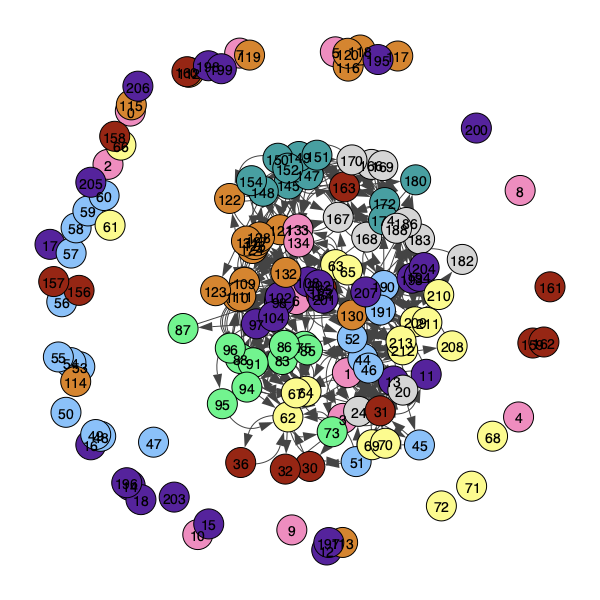

Room 0 has 11 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 11 tables (clones)
Room 3 has 14 tables (clones)
Room 4 has 17 tables (clones)
Room 5 has 12 tables (clones)
Room 6 has 14 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 12 tables (clones)
Room 9 has 12 tables (clones)
Room 10 has 12 tables (clones)
Room 11 has 12 tables (clones)
Room 12 has 11 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 6 tables (clones)
Room 15 has 10 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 4 tables (clones)
Room 18 has 15 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 214
Clones that would have been used by the original code: 100
model_lattice_alpha_0.8_seed_90.pkl
decode C: (1, 213, 213)
decode T: (1, 213, 213)
decode Pi: (20,)
decode n_clones: [15  9 11 11 11  9 12 13 19 11 14 10 12 11  5  6  7 12  9  6]
decode C: (1, 213, 213)
decode T: (1, 213, 213)
decode Pi: (20,)
decode n_clones: [15  9 11 11 11  9 12 13 19 11 14 10 12 11  5  6  7

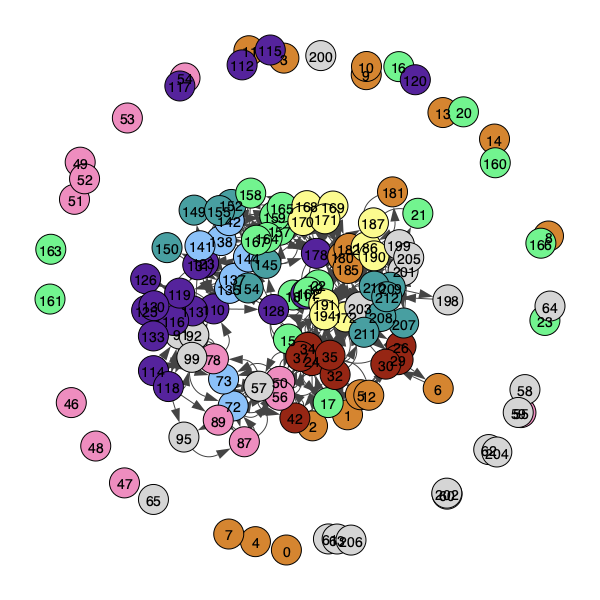

Room 0 has 15 tables (clones)
Room 1 has 9 tables (clones)
Room 2 has 11 tables (clones)
Room 3 has 11 tables (clones)
Room 4 has 11 tables (clones)
Room 5 has 9 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 13 tables (clones)
Room 8 has 19 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 14 tables (clones)
Room 11 has 10 tables (clones)
Room 12 has 12 tables (clones)
Room 13 has 11 tables (clones)
Room 14 has 5 tables (clones)
Room 15 has 6 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 12 tables (clones)
Room 18 has 9 tables (clones)
Room 19 has 6 tables (clones)
Total clones used: 213
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_0.pkl
decode C: (1, 220, 220)
decode T: (1, 220, 220)
decode Pi: (20,)
decode n_clones: [11 11 12 11 10 11  9 12 10  7  6  9 15 11 12 11 15 12 12 13]
decode C: (1, 220, 220)
decode T: (1, 220, 220)
decode Pi: (20,)
decode n_clones: [11 11 12 11 10 11  9 12 10  7  6  9 15 11 12 11 15 12

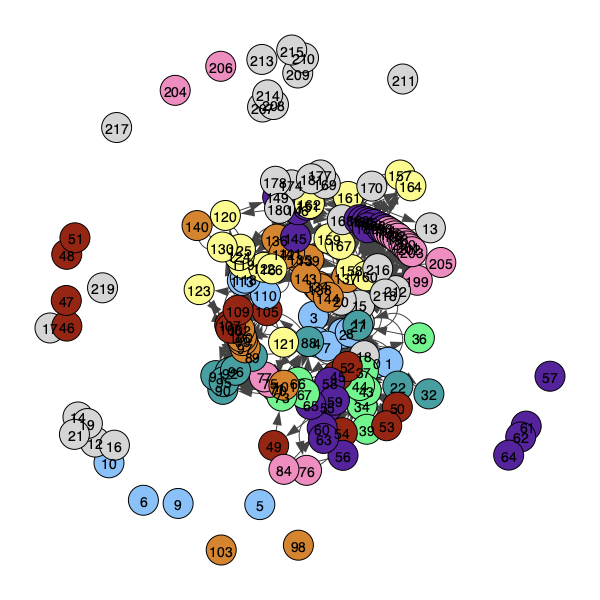

Room 0 has 11 tables (clones)
Room 1 has 11 tables (clones)
Room 2 has 12 tables (clones)
Room 3 has 11 tables (clones)
Room 4 has 10 tables (clones)
Room 5 has 11 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 12 tables (clones)
Room 8 has 10 tables (clones)
Room 9 has 7 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 15 tables (clones)
Room 13 has 11 tables (clones)
Room 14 has 12 tables (clones)
Room 15 has 11 tables (clones)
Room 16 has 15 tables (clones)
Room 17 has 12 tables (clones)
Room 18 has 12 tables (clones)
Room 19 has 13 tables (clones)
Total clones used: 220
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_10.pkl
decode C: (1, 231, 231)
decode T: (1, 231, 231)
decode Pi: (20,)
decode n_clones: [ 8 15 11 15 10 23  9  5 12 13  9 11 11 10 12 10 14  9  9 15]
decode C: (1, 231, 231)
decode T: (1, 231, 231)
decode Pi: (20,)
decode n_clones: [ 8 15 11 15 10 23  9  5 12 13  9 11 11 10 12 10 1

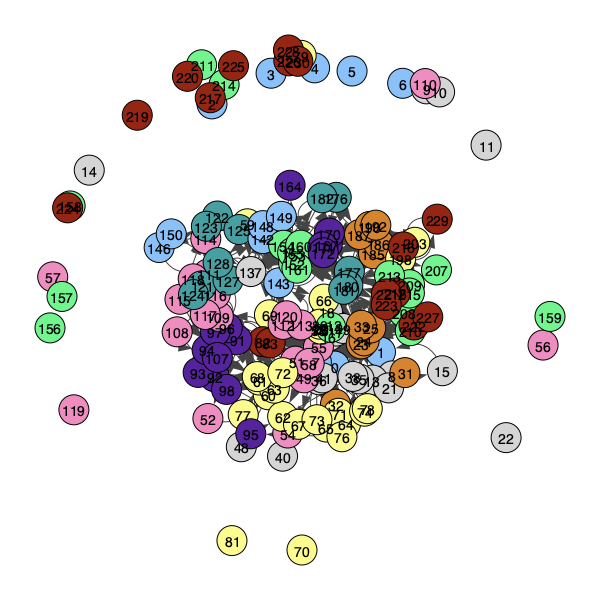

Room 0 has 8 tables (clones)
Room 1 has 15 tables (clones)
Room 2 has 11 tables (clones)
Room 3 has 15 tables (clones)
Room 4 has 10 tables (clones)
Room 5 has 23 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 5 tables (clones)
Room 8 has 12 tables (clones)
Room 9 has 13 tables (clones)
Room 10 has 9 tables (clones)
Room 11 has 11 tables (clones)
Room 12 has 11 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 12 tables (clones)
Room 15 has 10 tables (clones)
Room 16 has 14 tables (clones)
Room 17 has 9 tables (clones)
Room 18 has 9 tables (clones)
Room 19 has 15 tables (clones)
Total clones used: 231
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_20.pkl
decode C: (1, 193, 193)
decode T: (1, 193, 193)
decode Pi: (20,)
decode n_clones: [12  8  9 10  7  9  8  9 11  9  6 12  9 10 13  9  7  9 17  9]
decode C: (1, 193, 193)
decode T: (1, 193, 193)
decode Pi: (20,)
decode n_clones: [12  8  9 10  7  9  8  9 11  9  6 12  9 10 13  9  7 

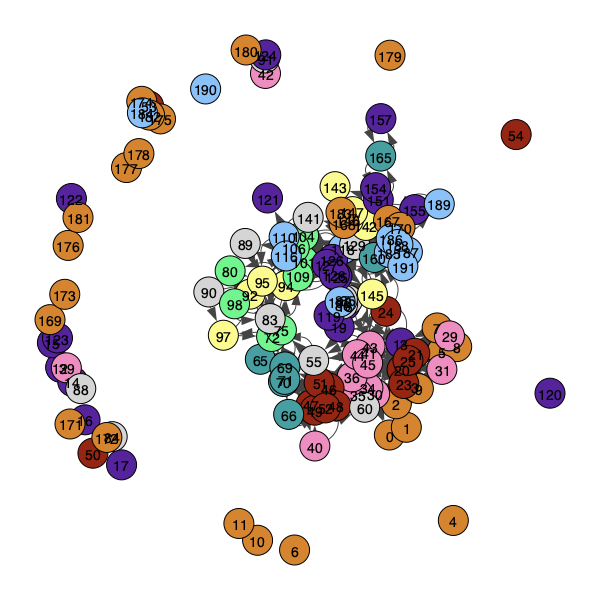

Room 0 has 12 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 10 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 9 tables (clones)
Room 6 has 8 tables (clones)
Room 7 has 9 tables (clones)
Room 8 has 11 tables (clones)
Room 9 has 9 tables (clones)
Room 10 has 6 tables (clones)
Room 11 has 12 tables (clones)
Room 12 has 9 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 13 tables (clones)
Room 15 has 9 tables (clones)
Room 16 has 7 tables (clones)
Room 17 has 9 tables (clones)
Room 18 has 17 tables (clones)
Room 19 has 9 tables (clones)
Total clones used: 193
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_30.pkl
decode C: (1, 242, 242)
decode T: (1, 242, 242)
decode Pi: (20,)
decode n_clones: [16 11 10 13 13 20  9 10 11 10 15 19  8 10 11 11 10 14 11 10]
decode C: (1, 242, 242)
decode T: (1, 242, 242)
decode Pi: (20,)
decode n_clones: [16 11 10 13 13 20  9 10 11 10 15 19  8 10 11 11 10 14 11 1

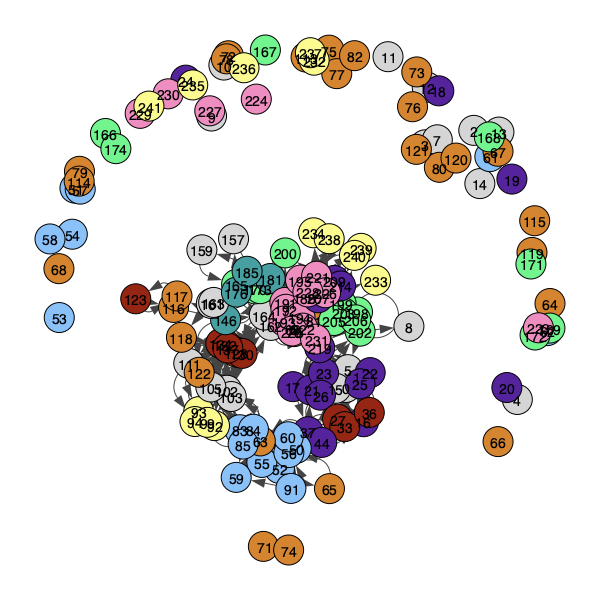

Room 0 has 16 tables (clones)
Room 1 has 11 tables (clones)
Room 2 has 10 tables (clones)
Room 3 has 13 tables (clones)
Room 4 has 13 tables (clones)
Room 5 has 20 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 11 tables (clones)
Room 9 has 10 tables (clones)
Room 10 has 15 tables (clones)
Room 11 has 19 tables (clones)
Room 12 has 8 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 11 tables (clones)
Room 15 has 11 tables (clones)
Room 16 has 10 tables (clones)
Room 17 has 14 tables (clones)
Room 18 has 11 tables (clones)
Room 19 has 10 tables (clones)
Total clones used: 242
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_40.pkl
decode C: (1, 248, 248)
decode T: (1, 248, 248)
decode Pi: (20,)
decode n_clones: [ 7 17  6 14 19 15  9 14 12 14 12 12 20 10  8  7 14 11 10 17]
decode C: (1, 248, 248)
decode T: (1, 248, 248)
decode Pi: (20,)
decode n_clones: [ 7 17  6 14 19 15  9 14 12 14 12 12 20 10  8  7

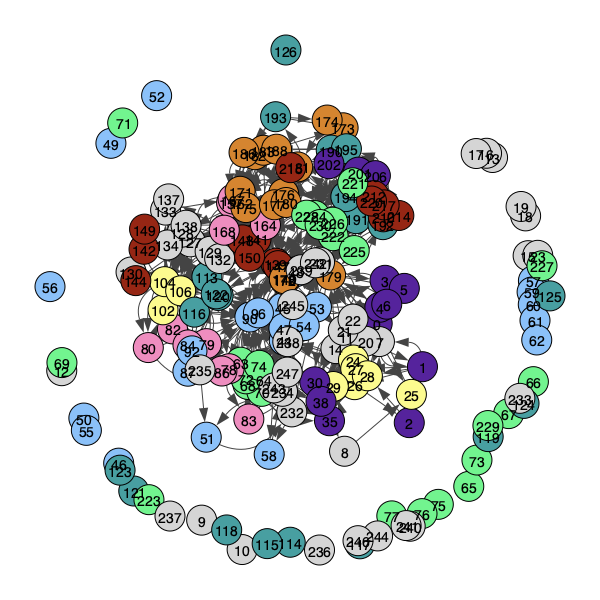

Room 0 has 7 tables (clones)
Room 1 has 17 tables (clones)
Room 2 has 6 tables (clones)
Room 3 has 14 tables (clones)
Room 4 has 19 tables (clones)
Room 5 has 15 tables (clones)
Room 6 has 9 tables (clones)
Room 7 has 14 tables (clones)
Room 8 has 12 tables (clones)
Room 9 has 14 tables (clones)
Room 10 has 12 tables (clones)
Room 11 has 12 tables (clones)
Room 12 has 20 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 8 tables (clones)
Room 15 has 7 tables (clones)
Room 16 has 14 tables (clones)
Room 17 has 11 tables (clones)
Room 18 has 10 tables (clones)
Room 19 has 17 tables (clones)
Total clones used: 248
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_50.pkl
decode C: (1, 250, 250)
decode T: (1, 250, 250)
decode Pi: (20,)
decode n_clones: [18 11 12 11 15 12 14 14 12 12 16  9  9 10 16 11 17 13  7 11]
decode C: (1, 250, 250)
decode T: (1, 250, 250)
decode Pi: (20,)
decode n_clones: [18 11 12 11 15 12 14 14 12 12 16  9  9 10 16 11 17

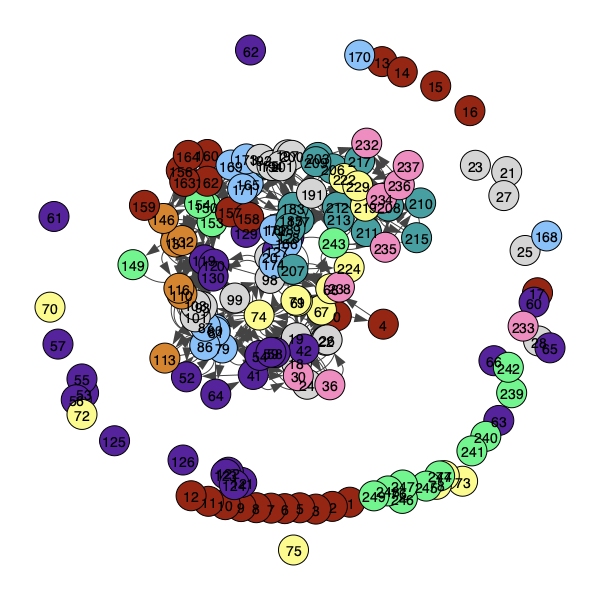

Room 0 has 18 tables (clones)
Room 1 has 11 tables (clones)
Room 2 has 12 tables (clones)
Room 3 has 11 tables (clones)
Room 4 has 15 tables (clones)
Room 5 has 12 tables (clones)
Room 6 has 14 tables (clones)
Room 7 has 14 tables (clones)
Room 8 has 12 tables (clones)
Room 9 has 12 tables (clones)
Room 10 has 16 tables (clones)
Room 11 has 9 tables (clones)
Room 12 has 9 tables (clones)
Room 13 has 10 tables (clones)
Room 14 has 16 tables (clones)
Room 15 has 11 tables (clones)
Room 16 has 17 tables (clones)
Room 17 has 13 tables (clones)
Room 18 has 7 tables (clones)
Room 19 has 11 tables (clones)
Total clones used: 250
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_60.pkl
decode C: (1, 246, 246)
decode T: (1, 246, 246)
decode Pi: (20,)
decode n_clones: [12 11 13 18 11 14 14 15 12 10 17 14 12  8 11  7 12 11 15  9]
decode C: (1, 246, 246)
decode T: (1, 246, 246)
decode Pi: (20,)
decode n_clones: [12 11 13 18 11 14 14 15 12 10 17 14 12  8 11  7 

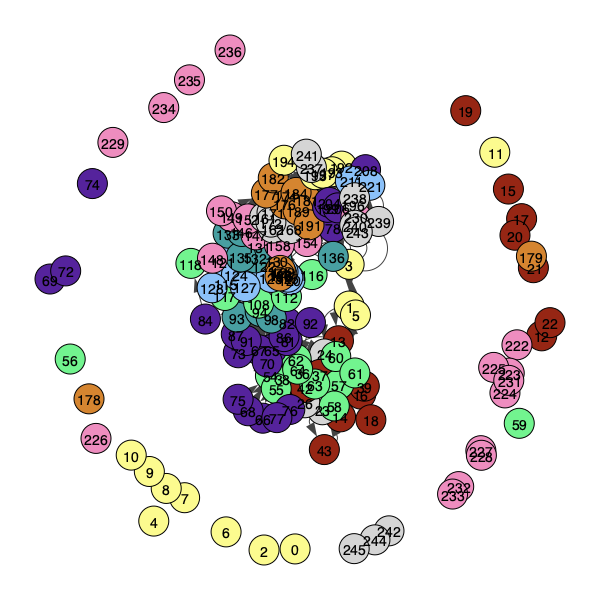

Room 0 has 12 tables (clones)
Room 1 has 11 tables (clones)
Room 2 has 13 tables (clones)
Room 3 has 18 tables (clones)
Room 4 has 11 tables (clones)
Room 5 has 14 tables (clones)
Room 6 has 14 tables (clones)
Room 7 has 15 tables (clones)
Room 8 has 12 tables (clones)
Room 9 has 10 tables (clones)
Room 10 has 17 tables (clones)
Room 11 has 14 tables (clones)
Room 12 has 12 tables (clones)
Room 13 has 8 tables (clones)
Room 14 has 11 tables (clones)
Room 15 has 7 tables (clones)
Room 16 has 12 tables (clones)
Room 17 has 11 tables (clones)
Room 18 has 15 tables (clones)
Room 19 has 9 tables (clones)
Total clones used: 246
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_70.pkl
decode C: (1, 214, 214)
decode T: (1, 214, 214)
decode Pi: (20,)
decode n_clones: [14 10 12 14  7 12 11 11  3 10 13 10 13 11  6 14 11 12  7 13]
decode C: (1, 214, 214)
decode T: (1, 214, 214)
decode Pi: (20,)
decode n_clones: [14 10 12 14  7 12 11 11  3 10 13 10 13 11  6 14 

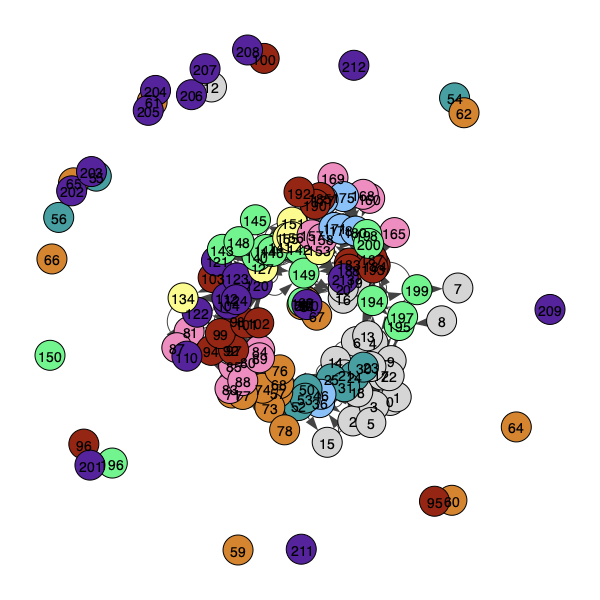

Room 0 has 14 tables (clones)
Room 1 has 10 tables (clones)
Room 2 has 12 tables (clones)
Room 3 has 14 tables (clones)
Room 4 has 7 tables (clones)
Room 5 has 12 tables (clones)
Room 6 has 11 tables (clones)
Room 7 has 11 tables (clones)
Room 8 has 3 tables (clones)
Room 9 has 10 tables (clones)
Room 10 has 13 tables (clones)
Room 11 has 10 tables (clones)
Room 12 has 13 tables (clones)
Room 13 has 11 tables (clones)
Room 14 has 6 tables (clones)
Room 15 has 14 tables (clones)
Room 16 has 11 tables (clones)
Room 17 has 12 tables (clones)
Room 18 has 7 tables (clones)
Room 19 has 13 tables (clones)
Total clones used: 214
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_80.pkl
decode C: (1, 219, 219)
decode T: (1, 219, 219)
decode Pi: (20,)
decode n_clones: [ 9  8  9  7 17 12 12  8 11 11 14 12 10 18  4 11 17 12  8  9]
decode C: (1, 219, 219)
decode T: (1, 219, 219)
decode Pi: (20,)
decode n_clones: [ 9  8  9  7 17 12 12  8 11 11 14 12 10 18  4 11 1

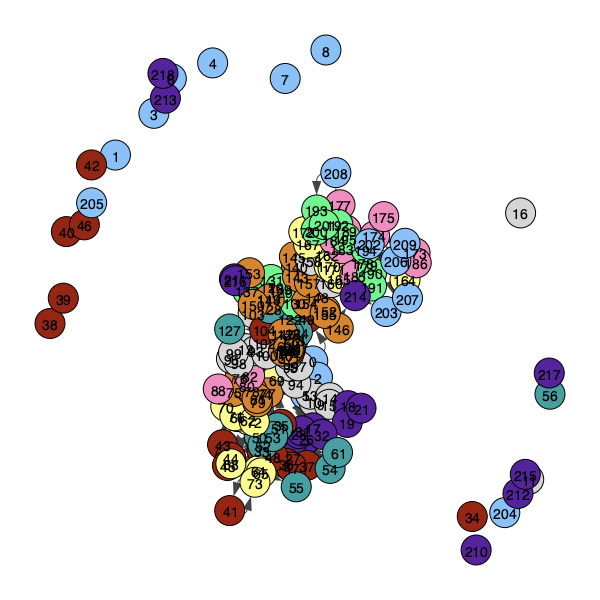

Room 0 has 9 tables (clones)
Room 1 has 8 tables (clones)
Room 2 has 9 tables (clones)
Room 3 has 7 tables (clones)
Room 4 has 17 tables (clones)
Room 5 has 12 tables (clones)
Room 6 has 12 tables (clones)
Room 7 has 8 tables (clones)
Room 8 has 11 tables (clones)
Room 9 has 11 tables (clones)
Room 10 has 14 tables (clones)
Room 11 has 12 tables (clones)
Room 12 has 10 tables (clones)
Room 13 has 18 tables (clones)
Room 14 has 4 tables (clones)
Room 15 has 11 tables (clones)
Room 16 has 17 tables (clones)
Room 17 has 12 tables (clones)
Room 18 has 8 tables (clones)
Room 19 has 9 tables (clones)
Total clones used: 219
Clones that would have been used by the original code: 100
model_lattice_alpha_0.9_seed_90.pkl
decode C: (1, 239, 239)
decode T: (1, 239, 239)
decode Pi: (20,)
decode n_clones: [11 12 16 12 12  9  6 10 15 13 14  6 14 15 11  8  9 19 13 14]
decode C: (1, 239, 239)
decode T: (1, 239, 239)
decode Pi: (20,)
decode n_clones: [11 12 16 12 12  9  6 10 15 13 14  6 14 15 11  8  9 19

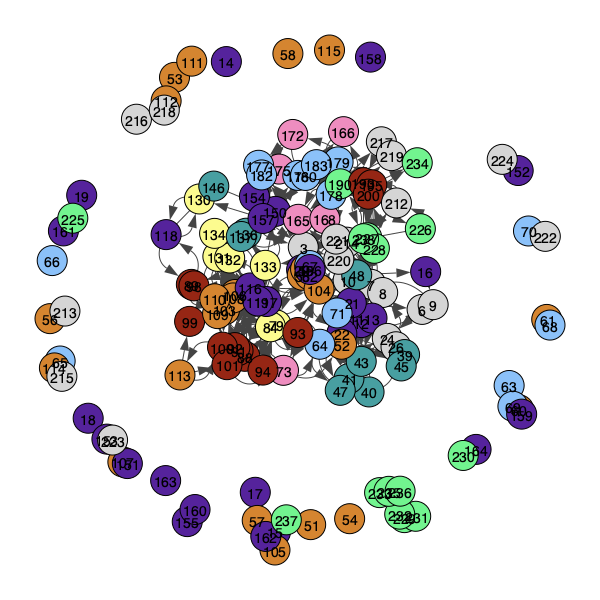

Room 0 has 11 tables (clones)
Room 1 has 12 tables (clones)
Room 2 has 16 tables (clones)
Room 3 has 12 tables (clones)
Room 4 has 12 tables (clones)
Room 5 has 9 tables (clones)
Room 6 has 6 tables (clones)
Room 7 has 10 tables (clones)
Room 8 has 15 tables (clones)
Room 9 has 13 tables (clones)
Room 10 has 14 tables (clones)
Room 11 has 6 tables (clones)
Room 12 has 14 tables (clones)
Room 13 has 15 tables (clones)
Room 14 has 11 tables (clones)
Room 15 has 8 tables (clones)
Room 16 has 9 tables (clones)
Room 17 has 19 tables (clones)
Room 18 has 13 tables (clones)
Room 19 has 14 tables (clones)
Total clones used: 239
Clones that would have been used by the original code: 100


In [8]:
nclone=1
# a,x,rc = datagen_structured_obs_room(room, length=50000)
alpha_results_nclones = []
alpha_results_totalclone = []
alphas = np.arange(0.1, 1, 0.1)
seeds = np.arange(0,100,10)
currmodel = 'lattice'
n_orig_clones = 70

#   # Create observation data
#   x = create_modular_graph_varied(num_nodes, num_observations, num_aliased_states, num_modules)
#   a = np.zeros(len(x), dtype=int)

#   n_clones = np.ones(max(x)+1, dtype=np.int64) * num_clones
#   container = TableContainer()
total_modularity_scores = []
for alpha in alphas: 
    seed_results_totalclone = []
    seed_results_nclones = []
    modularity_scores = []
    for seed in seeds: 
        filename = 'model_' + currmodel + '_alpha_' + str(alpha) + '_seed_' + str(seed) + '.pkl'
        folderpath = 'models'
        fullpath = os.path.join(folderpath, filename)
        if os.path.isfile(fullpath):
            try: 
                print(filename)
                with open(fullpath, 'rb') as file: 
                    chmm = pickle.load(file)
            except (pickle.UnpicklingError, EOFError) as e: 
                print("failed")
                
        chmm.pseudocount = 2e-100
        chmm.T += chmm.pseudocount
        states = chmm.decode(x, a)[1]
        n_states = len(np.unique(states))

        custom_colors = generate_custom_colors(max(x)+1)/256
        arr = np.arange(max(x)+1)
        np.random.shuffle(arr)
        cmap = colors.ListedColormap(custom_colors[arr])

        temp_output_file = f"modular_graph_num_nodes_{num_nodes}.png"  # Temporary file for each clone
        # graph, modularity_score, v, g = plot_graph_modularity(chmm, x, a, output_file=temp_output_file, cmap=cmap)
        graph, v, g = plot_graph(chmm, x, a, output_file=temp_output_file, cmap=cmap)
        # print('Ground truth number of nodes: {}, number of nodes recovered {}'.format(num_nodes, len(v)))
        # Display the image inline
        display(Image(filename=temp_output_file))
        
        
        # modularity_scores.append(modularity_score)

        n_clones = 0
        container = chmm.container
        table = []
        for roomid in range(len(container.groups_of_tables)):
            print("Room {} has {} tables (clones)".format(roomid, len(container.groups_of_tables[roomid])))
            n_clones+=len(container.groups_of_tables[roomid])
            table.append(len(container.groups_of_tables[roomid]))
        print("Total clones used: {}".format(n_clones))
        print("Clones that would have been used by the original code: {}".format(len(container.groups_of_tables) * 5))       
        
        seed_results_totalclone.append(n_clones)
        seed_results_nclones.append(table)
    alpha_results_totalclone.append(seed_results_totalclone)
    alpha_results_nclones.append(seed_results_nclones)
    # total_modularity_scores.append(modularity_score)
            
        

In [7]:
n_clones = 0
container = TableContainer()
# n_clones = np.ones(n_emissions, dtype=np.int64) * nclone
# container = TableContainer()
chmm = CHMM_LCM(n_clones=n_clones, pseudocount=2e-3, x=x, a=a, container=container,alpha=alpha,seed=42)  # Initialize the model
progression = chmm.learn_em_T(x, a, n_iter=20,
                            # term_early=False,
                            )  # Training   use n_iter=1000 for better training

100%|██████████| 20/20 [01:00<00:00,  3.01s/it, New best model at epoch 19 saved with loss 3.2844]


In [9]:
np.shape(chmm.T)

(1, 37, 37)

In [10]:
states = chmm.decode(x, a)[1]

## Comparing the graph edit distance with the ground-truth graph

In [4]:
# import numpy as np
import igraph as ig


def grid_to_directed_igraph(grid):
    """
    Convert a 2D numpy array to a directed igraph.Graph.
    Each cell has bidirectional connections to its horizontal and vertical neighbors.
    """
    rows, cols = grid.shape
    adjacency_matrix = np.zeros((rows * cols, rows * cols), dtype=int)

    index = lambda r, c: r * cols + c

    for r in range(rows):
        for c in range(cols):
            current_index = index(r, c)

            # North
            if r > 0:
                north_index = index(r - 1, c)
                adjacency_matrix[current_index, north_index] = 1
                adjacency_matrix[north_index, current_index] = 1

            # South
            if r < rows - 1:
                south_index = index(r + 1, c)
                adjacency_matrix[current_index, south_index] = 1
                adjacency_matrix[south_index, current_index] = 1

            # East
            if c < cols - 1:
                east_index = index(r, c + 1)
                adjacency_matrix[current_index, east_index] = 1
                adjacency_matrix[east_index, current_index] = 1

            # West
            if c > 0:
                west_index = index(r, c - 1)
                adjacency_matrix[current_index, west_index] = 1
                adjacency_matrix[west_index, current_index] = 1

    # Creating an igraph from the adjacency matrix
    graph = ig.Graph.Adjacency((adjacency_matrix > 0).tolist(), mode=ig.ADJ_DIRECTED)
    return graph

# Example room array
room = np.array([
    [1, 2, 3, 0, 3, 1, 1, 1],
    [1, 1, 3, 2, 3, 2, 3, 1],
    [1, 1, 2, 0, 1, 2, 1, 0],
    [0, 2, 1, 1, 3, 0, 0, 2],
    [3, 3, 1, 0, 1, 0, 3, 0],
    [2, 1, 2, 3, 3, 3, 2, 0],
])

directed_igraph = grid_to_directed_igraph(room)
print("Directed Graph Representation with igraph:")
print(directed_igraph)

Directed Graph Representation with igraph:
IGRAPH D--- 48 164 --
+ edges:
 0 ->  1  8         12 ->  4 11 13 20   24 -> 16 25 32      36 -> 28 35 37 44
 1 ->  0  2  9      13 ->  5 12 14 21   25 -> 17 24 26 33   37 -> 29 36 38 45
 2 ->  1  3 10      14 ->  6 13 15 22   26 -> 18 25 27 34   38 -> 30 37 39 46
 3 ->  2  4 11      15 ->  7 14 23      27 -> 19 26 28 35   39 -> 31 38 47
 4 ->  3  5 12      16 ->  8 17 24      28 -> 20 27 29 36   40 -> 32 41
 5 ->  4  6 13      17 ->  9 16 18 25   29 -> 21 28 30 37   41 -> 33 40 42
 6 ->  5  7 14      18 -> 10 17 19 26   30 -> 22 29 31 38   42 -> 34 41 43
 7 ->  6 15         19 -> 11 18 20 27   31 -> 23 30 39      43 -> 35 42 44
 8 ->  0  9 16      20 -> 12 19 21 28   32 -> 24 33 40      44 -> 36 43 45
 9 ->  1  8 10 17   21 -> 13 20 22 29   33 -> 25 32 34 41   45 -> 37 44 46
10 ->  2  9 11 18   22 -> 14 21 23 30   34 -> 26 33 35 42   46 -> 38 45 47
11 ->  3 10 12 19   23 -> 15 22 31      35 -> 27 34 36 43   47 -> 39 46


In [31]:
import igraph as ig
from queue import PriorityQueue

def heuristic(graph1, graph2):
    """
    Heuristic that considers both vertices and edges.
    """
    v_diff = abs(len(graph1.vs) - len(graph2.vs))
    e_diff = abs(len(graph1.es) - len(graph2.es))
    return v_diff + e_diff

def graph_edit_distance_igraph(graph1, graph2, max_iterations=10000):
    """
    Computes the approximate graph edit distance between two graphs
    using the A* algorithm with practical limitations.
    """
    frontier = PriorityQueue()
    graph_id = 0
    graphs = {graph_id: graph1}
    frontier.put((heuristic(graph1, graph2), 0, graph_id))
    graph_id += 1

    iterations = 0
    while not frontier.empty() and iterations < max_iterations:
        iterations += 1
        estimated_cost, actual_cost, current_graph_id = frontier.get()
        current_graph = graphs[current_graph_id]

        # Check if we reached the target structure
        if heuristic(current_graph, graph2) == 0:
            return actual_cost

        # Try adding and removing vertices and edges
        if len(current_graph.vs) < 20:  # Limit vertex count for demo purposes
            new_graph = current_graph.copy()
            new_graph.add_vertices(1)
            new_cost = actual_cost + 1
            graphs[graph_id] = new_graph
            frontier.put((new_cost + heuristic(new_graph, graph2), new_cost, graph_id))
            graph_id += 1

        if len(current_graph.vs) > 1:
            for v in range(len(current_graph.vs)):
                new_graph = current_graph.copy()
                new_graph.delete_vertices(v)
                new_cost = actual_cost + 1
                graphs[graph_id] = new_graph
                frontier.put((new_cost + heuristic(new_graph, graph2), new_cost, graph_id))
                graph_id += 1
                break  # Limit to one vertex modification per expansion for demo

        # Check if edges can be modified if graphs are similar in vertices but differ in edges
        if len(current_graph.vs) == len(graph2.vs):
            for e in current_graph.es:
                new_graph = current_graph.copy()
                new_graph.delete_edges(e.index)
                new_cost = actual_cost + 1
                graphs[graph_id] = new_graph
                frontier.put((new_cost + heuristic(new_graph, graph2), new_cost, graph_id))
                graph_id += 1
                break  # Limit to one edge modification for demo

    return float('inf')  # Return infinity if no solution found within the constraints

# Example usage would involve defining specific igraph instances to test this function.

# # Example usage with igraph.Graph
# room_graph = ig.Graph.Adjacency((room > 0).tolist())
# target_graph = ig.Graph.Adjacency((np.random.randint(0, 2, room.shape) > 0).tolist())

# ged = graph_edit_distance_igraph(room_graph, target_graph)
# print(f"Graph Edit Distance: {ged}")


In [38]:
def spectral_similarity(graph1, graph2):
    L1 = np.array(graph1.laplacian())
    L2 = np.array(graph2.laplacian())
    eigenvalues1 = np.sort(np.linalg.eigvals(L1))
    eigenvalues2 = np.sort(np.linalg.eigvals(L2))

    # Pad the smaller array of eigenvalues to match the larger one
    max_len = max(len(eigenvalues1), len(eigenvalues2))
    eigenvalues1 = np.pad(eigenvalues1, (0, max_len - len(eigenvalues1)), 'constant')
    eigenvalues2 = np.pad(eigenvalues2, (0, max_len - len(eigenvalues2)), 'constant')

    # Calculate the Euclidean distance between the eigenvalue arrays
    distance = np.linalg.norm(eigenvalues1 - eigenvalues2)
    return distance

In [22]:
np.arange(0,100,10)

array([ 0, 10, 20, 30, 40, 50, 60, 70, 80, 90])

In [40]:
nclone=1
a,x,rc = datagen_structured_obs_room(room, length=50000)
# alpha_results_nclones = []
# alpha_results_totalclone = []
geds = []
alphas = np.arange(0.1, 1, 0.1)
seeds = np.arange(0,100,10) # modified to save time
currmodel = 'spatial'
n_orig_clones = 70
for alpha in alphas: 
    # seed_results_totalclone = []
    # seed_results_nclones = []
    seed_geds = []
    for seed in seeds: 
        filename = 'model_' + currmodel + '_alpha_' + str(alpha) + '_seed_' + str(seed) + '.pkl'
        folderpath = 'models'
        fullpath = os.path.join(folderpath, filename)
        if os.path.isfile(fullpath):
            try: 
                print(filename)
                with open(fullpath, 'rb') as file: 
                    chmm = pickle.load(file)
            except (pickle.UnpicklingError, EOFError) as e: 
                print("failed")
        chmm.pseudocount = 0.01

        temp_output_file = f"rectangular_room_graph_large_num_clones_{nclone}.png" # Temporary file for each clone
        # graph, v, g = plot_graph(chmm, x, a, output_file=temp_output_file, cmap=cmap)

        graph, v, g = plot_graph(chmm, x, a, output_file=temp_output_file, cmap=cmap)
        # score = graph_edit_distance_igraph(g, directed_igraph)
        score = spectral_similarity(g,directed_igraph)
        seed_geds.append(score)
        print(score)
    geds.append(seed_geds)

model_spatial_alpha_0.1_seed_0.pkl
decode C: (4, 14, 14)
decode T: (4, 14, 14)
decode Pi: (4,)
decode n_clones: [6 4 3 1]
37.22372935708246
model_spatial_alpha_0.1_seed_10.pkl
decode C: (4, 9, 9)
decode T: (4, 9, 9)
decode Pi: (4,)
decode n_clones: [2 2 3 2]
31.55474045508928
model_spatial_alpha_0.1_seed_20.pkl
decode C: (4, 13, 13)
decode T: (4, 13, 13)
decode Pi: (4,)
decode n_clones: [2 4 3 4]
34.52754543037845
model_spatial_alpha_0.1_seed_30.pkl
decode C: (4, 10, 10)
decode T: (4, 10, 10)
decode Pi: (4,)
decode n_clones: [2 2 3 3]
34.490746699336164
model_spatial_alpha_0.1_seed_40.pkl
decode C: (4, 10, 10)
decode T: (4, 10, 10)
decode Pi: (4,)
decode n_clones: [1 2 5 2]
32.68821391306014
model_spatial_alpha_0.1_seed_50.pkl
decode C: (4, 8, 8)
decode T: (4, 8, 8)
decode Pi: (4,)
decode n_clones: [2 2 2 2]
31.007904956770762
model_spatial_alpha_0.1_seed_60.pkl
decode C: (4, 11, 11)
decode T: (4, 11, 11)
decode Pi: (4,)
decode n_clones: [2 6 2 1]
31.464731301515975
model_spatial_alpha

In [41]:
np.mean(geds,axis=0)


array([38.87402363, 40.89811239, 40.33908948, 40.65842353, 40.71010805,
       40.80950581, 41.81042349, 43.12211455, 40.92801616, 41.43108122])

In [42]:
np.std(geds,axis=0)

array([5.14637577, 3.68115964, 3.77352664, 3.77758989, 4.5162894 ,
       4.74330065, 4.19387617, 6.56863571, 2.67718338, 4.25676414])

In [39]:
spectral_similarity(g, directed_igraph)

34.490746699336164